# EDA

In [ ]:
# install packages
#!pip install geopandas
#!pip install descartes
#!pip install tilemapbase
#!pip install xgboost
#!pip install lightgbm
#!pip install imblearn

In [ ]:
# import standard libraries
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import xgboost as xgb 
import lightgbm as lgbm 

import descartes
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import tilemapbase

from math import sqrt
from scipy.stats import norm
from shapely.geometry import Point, Polygon 
from sklearn import metrics

import re
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', 100)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### Data Dictionary

|Feature|Type|Dataset|Description|
|---|---|---|---|
|species|object|combined|Species of mosquito|
|block|float64|combined|Block number of address|
|street|object|combined|Street name|
|trap|object|combined|Id of the trap|
|latitude|float64|combined|Latitude|
|longitude|float64|combined|Longitude|
|addressaccuracy|float64|combined|Number of mosquitoes caught in this trap|
|nummosquitos|float64|combined|Number of mosquitoes caught in this trap|
|wnvpresent|float64|combined|whether West Nile Virus was present in these mosquitos|
|tavg|float64|combined|Average Temperature|
|dewpoint|float64|combined|Average Dew Point|
|wetbulb|float64|combined|Average Wet Bulb|
|preciptotal|float64|combined|Precipitation in inches|
|stnpressure|float64|combined|Average Station Pressure|
|sealevel|float64|combined|Sea level|
|resultspeed|float64|combined|Resultant wind speed|
|resultdir|float64|combined|Resultant direction|
|avgspeed|float64|combined|Average wind speed|
|year|int64|combined|Year the WNV test was performed|
|month|int64|combined|Month the WNV test was performed|
|day|int64|combined|Day the WNV test was performed|
|pesticide|category|combined|Presence of Presticide|


In [ ]:
# read in and assign dataframes
spray_df = pd.read_csv('datasets/spray_clean.csv')
weather_df = pd.read_csv('datasets/weather_clean.csv')
train_df = pd.read_csv('datasets/train_clean.csv')
combined_df = pd.read_csv('datasets/combined_df.csv')

In [ ]:
combined_df.head(1)

,date,species,block,street,trap,latitude,longitude,addressaccuracy,nummosquitos,wnvpresent,tavg,dewpoint,wetbulb,codesum,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,year,month,day
0,2007-05-29,CULEX PIPIENS/RESTUANS,41.0,N OAK PARK AVE,T002,41.95469,-87.800991,9.0,1.0,0.0,74.0,58.0,65.0,BR HZ,0.0,29.39,30.11,5.8,18.0,6.5,2007,5,29


## Mosquito-related Variables

### Total Mosquito Count by Year

In [ ]:
# see unique values for year
combined_df['year'].value_counts()

2007    3231
2013    2323
2009    2047
2011    2000
Name: year, dtype: int64

The showed that the peak of the mosquito population was at its highest on 2007.  it did go down as years progress but it grew again in 2013.

### Total Mosquito Count by Month

In [ ]:
# see unique values for month
combined_df['month'].value_counts()

8     3308
7     2427
9     2112
6     1395
10     276
5       83
Name: month, dtype: int64

August seems to be the peak of the highest count of mosquitoes per year.  

### Total Mosquito Count by Block

In [ ]:
# see the total of each unique block
combined_df['block'].value_counts().head(10)

10.0    1425
11.0     695
22.0     482
13.0     343
37.0     315
17.0     301
42.0     287
70.0     283
12.0     271
52.0     269
Name: block, dtype: int64

** Please use this link to see the https://en.wikipedia.org/wiki/Community_areas_in_Chicago#/media/File:Chicago_Community_Areas.svg as reference**

Block 10 seems to have the highest density of mosquito population.   According to how the city set up their blocking, block 10 seem to be near the international airport and golf course where natural water as well as high grass field the major landscape.  It is also a great mosquito breeding ground if there are many stagnant water pockets. The blocks with high densities of mosquitos will be visualised in a density plot with a map of chicago later on.

<AxesSubplot:xlabel='block', ylabel='count'>

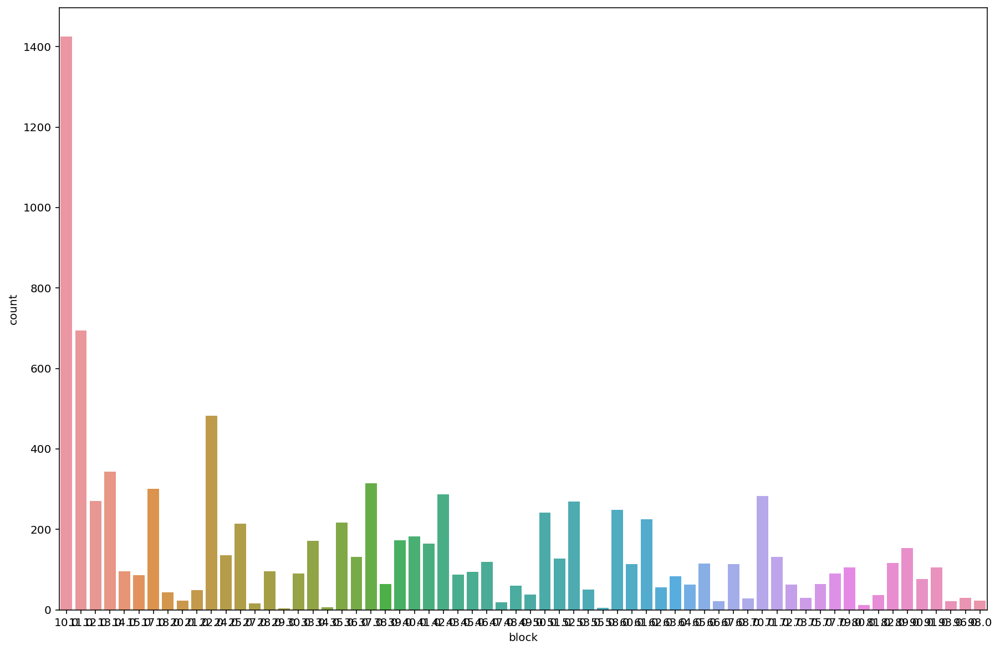

In [ ]:
# plot block to see it visually
plt.figure(figsize=(15,10))
sns.countplot(x='block', data=combined_df)

### Mosquito Count by Species

In [ ]:
# basic description of mosquito by species
combined_df['species'].describe()

count                       9601
unique                         7
top       CULEX PIPIENS/RESTUANS
freq                        4425
Name: species, dtype: object

In [ ]:
# see the count for each species
combined_df['species'].value_counts()

CULEX PIPIENS/RESTUANS    4425
CULEX RESTUANS            2636
CULEX PIPIENS             2231
CULEX TERRITANS            220
CULEX SALINARIUS            82
CULEX TARSALIS               6
CULEX ERRATICUS              1
Name: species, dtype: int64

<AxesSubplot:xlabel='species', ylabel='count'>

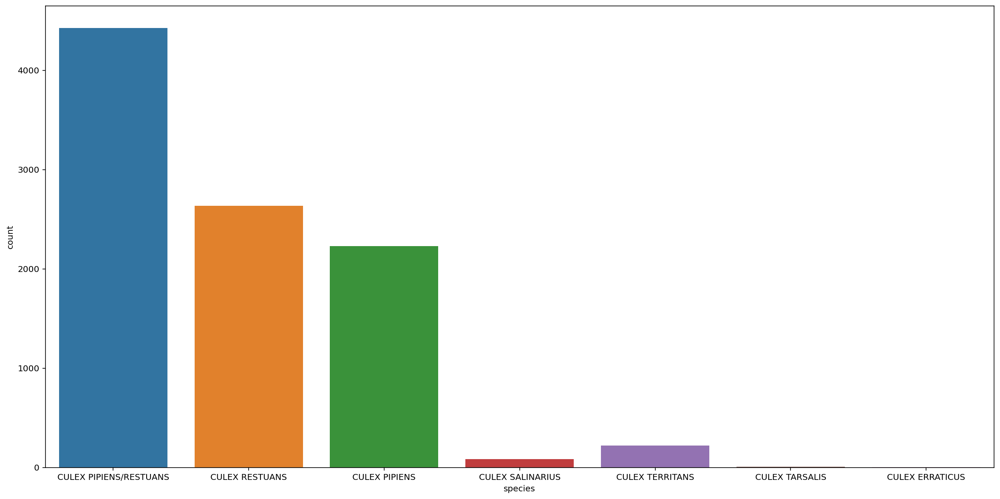

In [ ]:
# create a bar plot for visualization
plt.figure(figsize=(20,10))
sns.countplot(x='species', data=combined_df)

There is no class imbalance for mosquito species, but there are minority members in this group. 

Hence, except for CULEX PIPIENS/RESTUANS, CULEX PIPIENS, CULEX RESTUANS, we will collapse the other species (CULEX SALINARIUS, CULEX TERRITANS, CULEX TARSALIS, CULEX ERRATICUS) into one sub-category called OTHERS.

<AxesSubplot:xlabel='species', ylabel='count'>

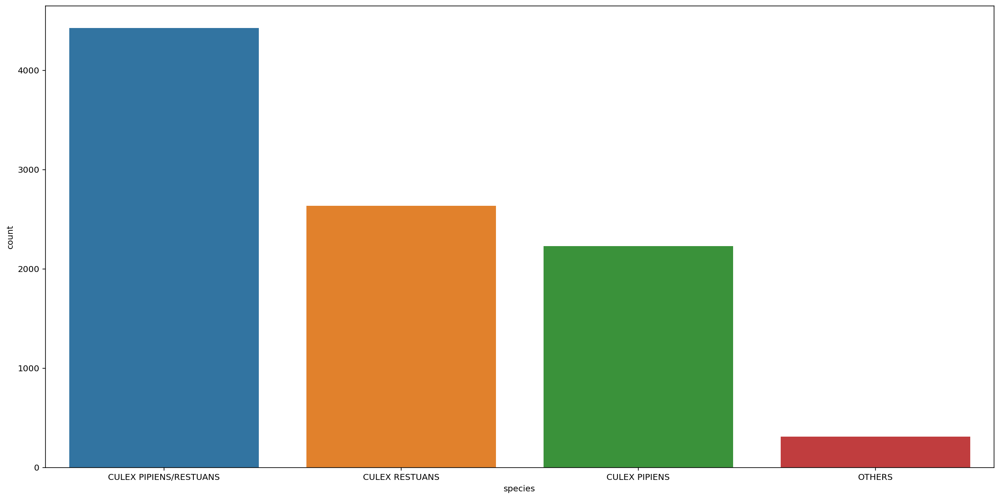

In [ ]:
combined_df["species"].replace({
    "CULEX SALINARIUS":"OTHERS", 
    "CULEX TERRITANS":"OTHERS",
    "CULEX TARSALIS":"OTHERS",
    "CULEX ERRATICUS":"OTHERS"
}, inplace=True)

plt.figure(figsize=(20,10))
sns.countplot(x='species', data=combined_df)

### Mosquito Count by Species and Block

In [ ]:
# sorting the mosquito count by block and species
combined_df[['block', 'species']].value_counts()

block  species               
10.0   CULEX PIPIENS/RESTUANS    613
       CULEX RESTUANS            439
       CULEX PIPIENS             341
11.0   CULEX PIPIENS/RESTUANS    323
22.0   CULEX PIPIENS/RESTUANS    220
11.0   CULEX RESTUANS            187
       CULEX PIPIENS             169
17.0   CULEX PIPIENS/RESTUANS    146
13.0   CULEX PIPIENS/RESTUANS    145
37.0   CULEX PIPIENS/RESTUANS    138
70.0   CULEX PIPIENS/RESTUANS    135
22.0   CULEX RESTUANS            129
12.0   CULEX PIPIENS/RESTUANS    128
52.0   CULEX PIPIENS/RESTUANS    121
61.0   CULEX PIPIENS/RESTUANS    121
22.0   CULEX PIPIENS             115
58.0   CULEX PIPIENS/RESTUANS    112
42.0   CULEX PIPIENS/RESTUANS    112
50.0   CULEX PIPIENS/RESTUANS    110
35.0   CULEX PIPIENS/RESTUANS    107
25.0   CULEX PIPIENS/RESTUANS    101
17.0   CULEX RESTUANS             95
13.0   CULEX PIPIENS              88
40.0   CULEX PIPIENS/RESTUANS     88
70.0   CULEX RESTUANS             87
37.0   CULEX RESTUANS             86
13.0   C

Block 10 have the highest count of the 3 species of mosquito that can carry the WNV.  Again, because it is close to the airport and the golf course, one have to assume that the greenery near the area have places that retains water for breeding. 

### Mosquito Count by Species and Year

Text(0.5, 1.0, 'Year vs Species')

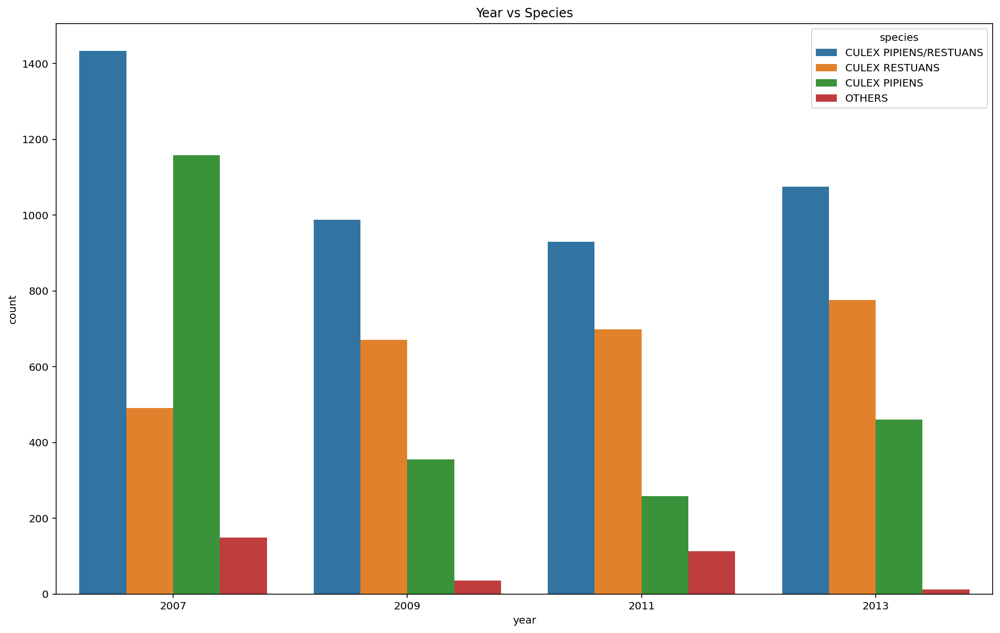

In [ ]:
#create a bar graph that displays the count of each species by years to showcase the difference
plt.figure(figsize=(16,10))
sns.countplot(x='year', data=combined_df, hue='species')
plt.title("Year vs Species")

Across 2007 to 2011, the mosquito population slowly decreased, but increased again in 2013. In general, the hybrid Culex Pipiens/Restuans mosquitos were the most common mosquitos trapped.

### Mosquito Count by Species and Month

Text(0.5, 1.0, 'Month vs Species')

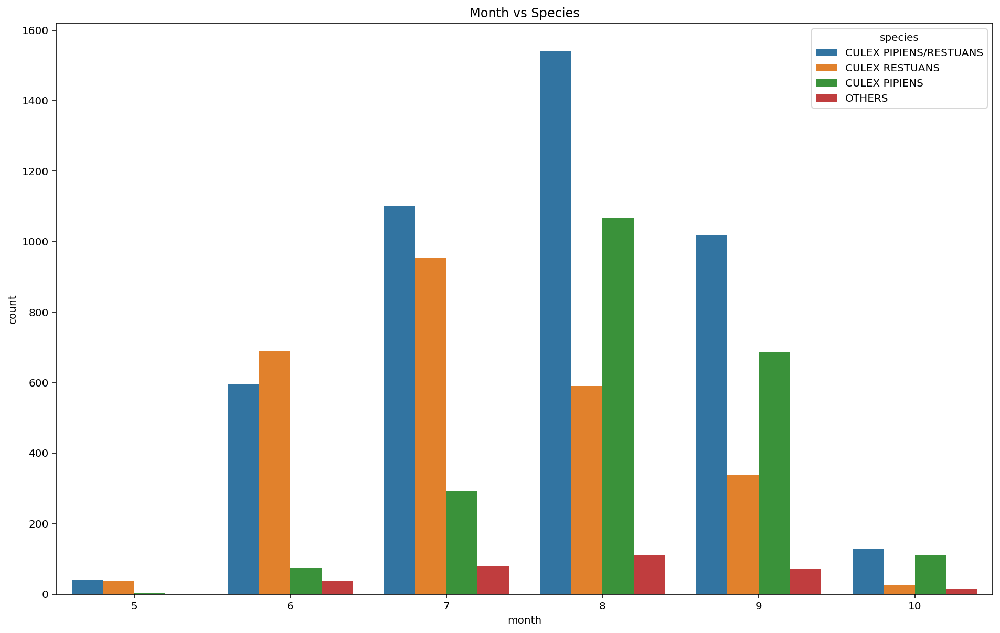

In [ ]:
plt.figure(figsize=(16,10))
sns.countplot(x='month', data=combined_df, hue='species')
plt.title("Month vs Species")

From this graph, we can see quite clearly that the mosquito population peaks around August, which makes sense as the heat in Chicago peaks in August, then starts to cool from August onwards. ([*source*](https://www.currentresults.com/Weather/Illinois/Places/chicago-weather-in-august.php))

We can further classify the mosquitoes according to whether or not they are found to be carriers of the WNV.

### Mosquito Count by WMV Presence

Text(0.5, 1.0, 'Carrying vs. Not WNV Carrying Mosquitoes')

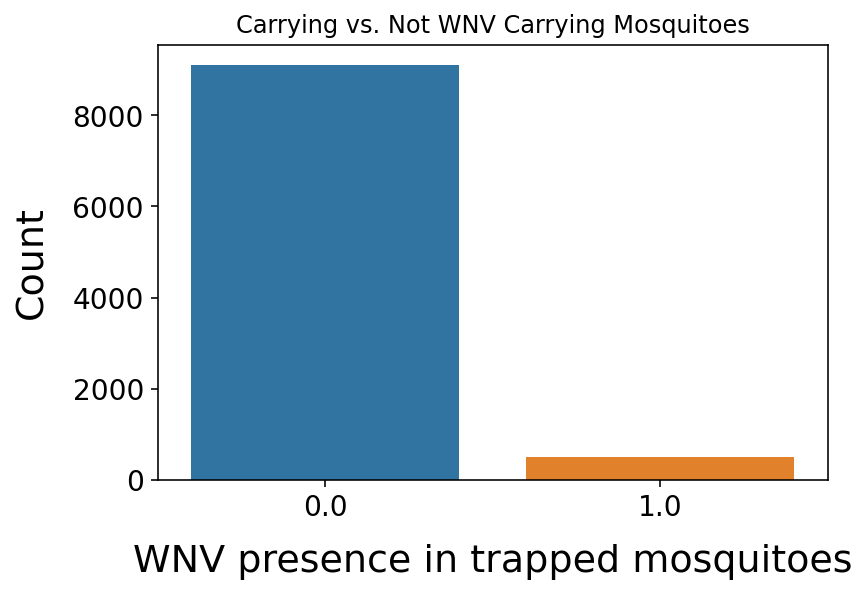

In [ ]:
# countplot of wnvpresent for a more detailed view of the distribution
sns.countplot(x="wnvpresent", data=combined_df)

plt.xlabel('WNV presence in trapped mosquitoes', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Count', fontsize=19, labelpad=11)
plt.yticks(fontsize=14)
plt.title('Carrying vs. Not WNV Carrying Mosquitoes')

Most of the mosquitos trapped did not have West Nile Virus. The difference is more than 10-fold, and this relates to the class imbalance that we will takle during the modelling portion later on.

In [ ]:
# count of WNV carriers by species
mos_wnv = combined_df[['species','wnvpresent']].groupby(by='species').sum()
mos_wnv.sort_values('wnvpresent', ascending=False, inplace=True)
mos_wnv

,wnvpresent
species,
CULEX PIPIENS/RESTUANS,246.0
CULEX PIPIENS,208.0
CULEX RESTUANS,49.0
OTHERS,0.0


Text(0.5, 1.0, 'Count of Mosquitoes with WNV by Species')

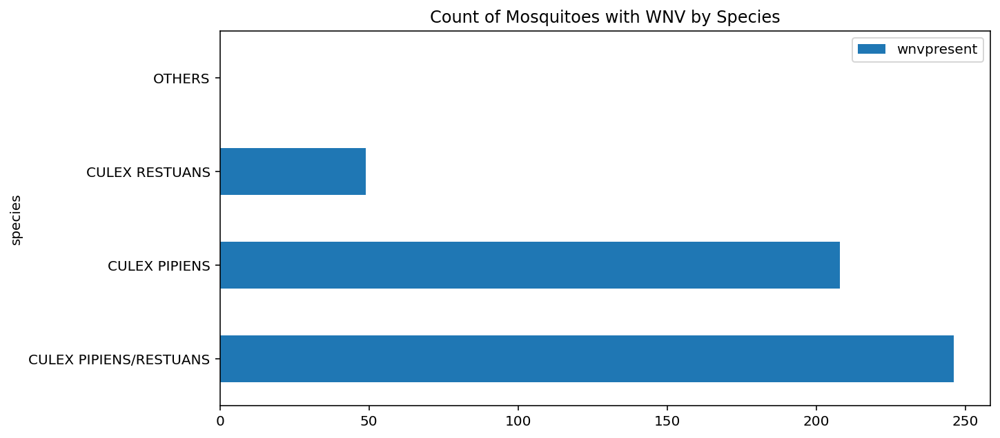

In [ ]:
mos_wnv.plot(kind='barh', figsize=(10,5))
plt.title("Count of Mosquitoes with WNV by Species")

Only Culex Restuans, Pipiens and Pipiens/Restuans were found to have WNV, compared to the other mosquitoes trapped, which made sense as these 3 mosquito species are carriers of WNV whereas the other mosquitoes are not.

## Map Visualisations

In [ ]:
#Generate Geometry from longitude and latitude to prepare for mapping
geometry = [Point(xy) for xy in zip( combined_df['longitude'], combined_df['latitude'])]
geometry[:3]
geo_df = gpd.GeoDataFrame(combined_df,                     
                         geometry=geometry)
geo_df.head()

,date,species,block,street,trap,latitude,longitude,addressaccuracy,nummosquitos,wnvpresent,tavg,dewpoint,wetbulb,codesum,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,year,month,day,geometry
0,2007-05-29,CULEX PIPIENS/RESTUANS,41.0,N OAK PARK AVE,T002,41.954690,-87.800991,9.0,1.0,0.0,74.0,58.0,65.0,BR HZ,0.0,29.39,30.11,5.8,18.0,6.5,2007,5,29,POINT (-87.80099 41.95469)
1,2007-05-29,CULEX RESTUANS,41.0,N OAK PARK AVE,T002,41.954690,-87.800991,9.0,1.0,0.0,74.0,58.0,65.0,BR HZ,0.0,29.39,30.11,5.8,18.0,6.5,2007,5,29,POINT (-87.80099 41.95469)
2,2007-05-29,CULEX RESTUANS,62.0,N MANDELL AVE,T007,41.994991,-87.769279,9.0,1.0,0.0,74.0,58.0,65.0,BR HZ,0.0,29.39,30.11,5.8,18.0,6.5,2007,5,29,POINT (-87.76928 41.99499)
3,2007-05-29,CULEX PIPIENS/RESTUANS,79.0,W FOSTER AVE,T015,41.974089,-87.824812,8.0,1.0,0.0,74.0,58.0,65.0,BR HZ,0.0,29.39,30.11,5.8,18.0,6.5,2007,5,29,POINT (-87.82481 41.97409)
4,2007-05-29,CULEX RESTUANS,79.0,W FOSTER AVE,T015,41.974089,-87.824812,8.0,4.0,0.0,74.0,58.0,65.0,BR HZ,0.0,29.39,30.11,5.8,18.0,6.5,2007,5,29,POINT (-87.82481 41.97409)


Set geometry to EPSG:4326 (uses a coordinate system on the surface of a sphere or ellipsoid of reference) <br />
Then convert to EPSG:3857 (uses a coordinate system PROJECTED from the surface of the sphere or ellipsoid to a flat surface.) <br />
Since EPSG:4326 is in degrees on a 3D sphere, we need to convert it to EPSG:3857 which allows for 2D projection in meters, so we can visualise the points on a map

In [ ]:
geo_df = geo_df.set_crs('epsg:4326')
geo_df = geo_df.to_crs("EPSG:3857")

#generate street map of Chicago
street_map = gpd.read_file('media/city boundaries google/')
street_map = street_map.to_crs("EPSG:3857")

In [ ]:
#Instantiate Tilemapbase, 
#so we can plot the base map to visualise our mosquito and spray locations
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(street_map, buffer = 25)
wnv_present = geo_df[geo_df['wnvpresent'] == 1]
wnv_absent = geo_df[geo_df['wnvpresent'] == 0]

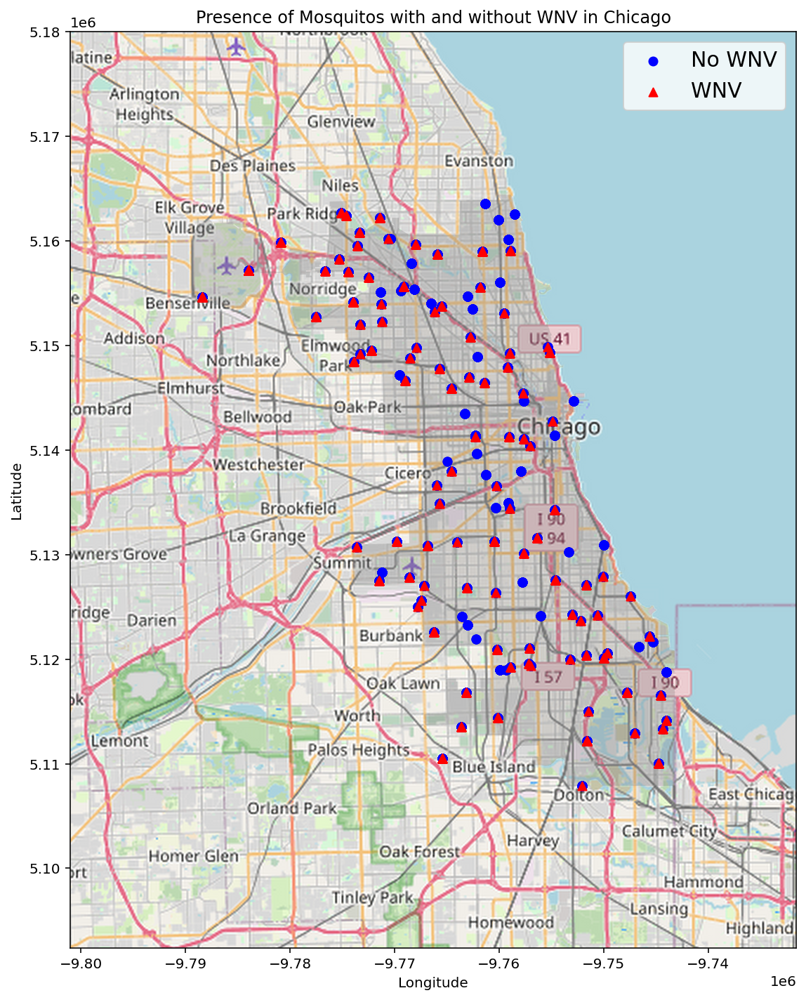

In [ ]:
#Plot map of Chicago with WNV presence
t = tilemapbase.tiles.build_OSM()
fig,ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)
street_map.plot(ax = ax, alpha = 0.3, color='grey')
wnv_absent.plot(ax = ax, color = 'blue', marker = 'o', label ='No WNV')
wnv_present.plot(ax = ax, color = 'red', marker = '^', label ='WNV')
plt.title("Presence of Mosquitos with and without WNV in Chicago")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(prop={'size':15})

From the map, there seems to be some areas with higher WNV mosquitos, but this would likely be clearer with a density plot, which we will show later.

### WMV Mosquito Count by Location

In [ ]:
#see the total of each unique lats & longs
combined_df[['latitude','longitude']].value_counts().head()

latitude   longitude 
41.974689  -87.890615    612
41.673408  -87.599862    209
41.726465  -87.585413    181
41.662014  -87.724608    170
41.954690  -87.800991    164
dtype: int64

In [ ]:
latitude_list = []
for i in set(combined_df.latitude.values):
    latitude_list.append(combined_df[combined_df.latitude == i]['wnvpresent'].mean())

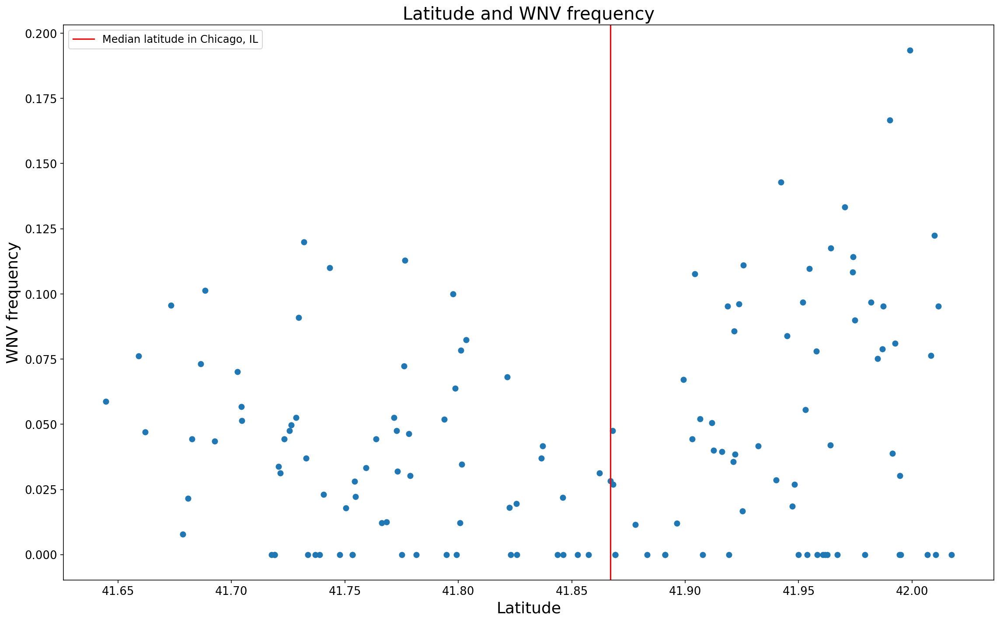

In [ ]:
plt.figure(figsize=(16, 10))
plt.scatter(list(set(combined_df.latitude.values)), latitude_list)
plt.axvline(combined_df.latitude.median(),  color='red', label='Median latitude in Chicago, IL')
plt.xlabel('Latitude', size=18)
plt.ylabel('WNV frequency', size=18)
plt.xticks(size=13)
plt.yticks(size=13)
plt.title('Latitude and WNV frequency', size=20)
plt.legend(fontsize=12, loc=2)
plt.tight_layout()

Plotting the mosquito count against the latitude shows that the there are more WMV-carrying mosquitoes in the north of Chicago compare to the south.

In [ ]:
longitude_list = []
for i in set(combined_df.longitude.values):
    longitude_list.append(combined_df[combined_df.longitude == i]['wnvpresent'].mean())

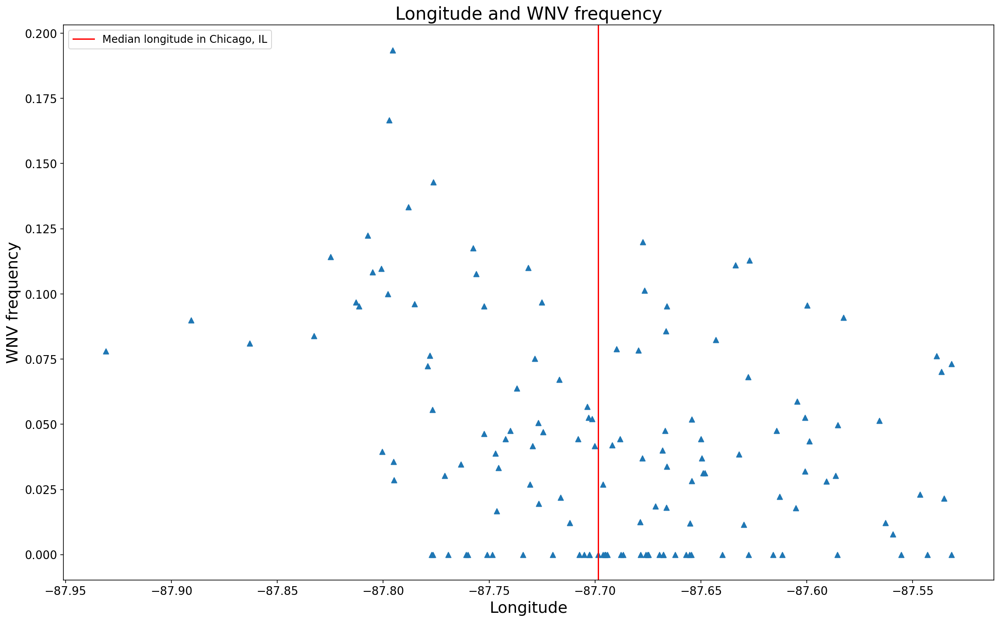

In [ ]:
plt.figure(figsize=(16, 10))
plt.scatter(list(set(combined_df.longitude.values)), longitude_list, marker='^', )
plt.axvline(combined_df.longitude.median(),  color='red', label='Median longitude in Chicago, IL')
plt.xlabel('Longitude', size=18)
plt.ylabel('WNV frequency', size=18)
plt.xticks(size=13)
plt.yticks(size=13)
plt.title('Longitude and WNV frequency', size=20)
plt.legend(fontsize=12, loc=2)
plt.tight_layout()

Plotting the mosquito count against the latitude shows that the there are more WMV-carrying mosquitoes in the east of Chicago as compared to the west.

### Area Density of All Mosquito Presence

Text(0, 0.5, 'Latitude')

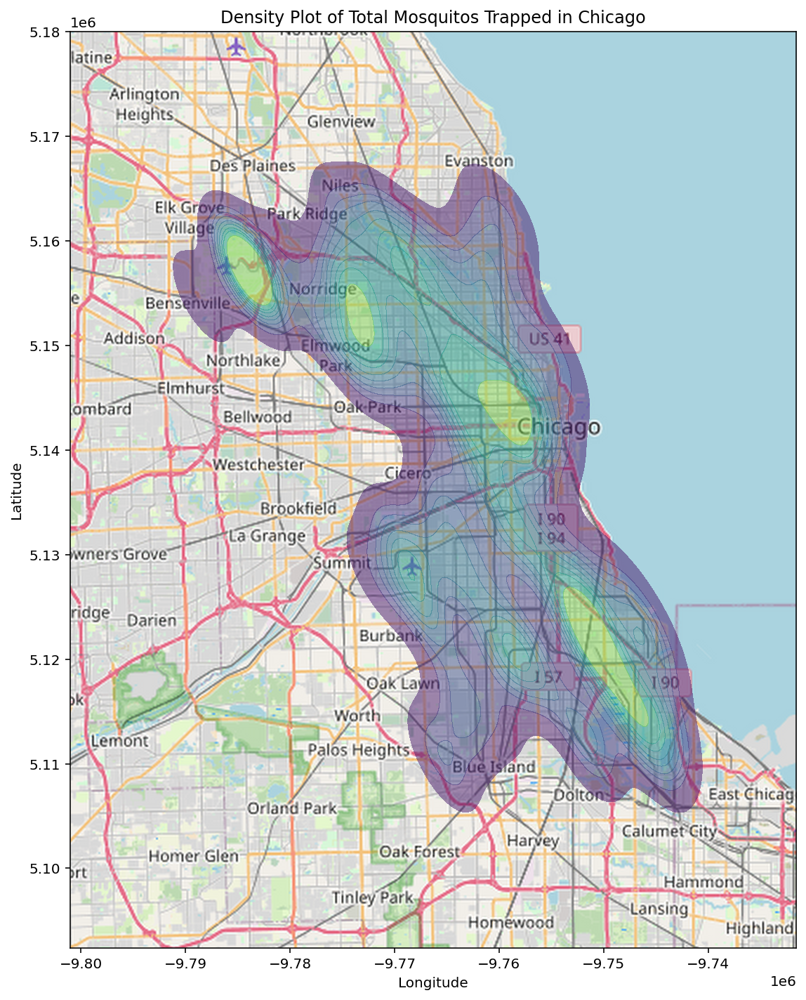

In [ ]:
# density plot of total mosquito count from traps
t = tilemapbase.tiles.build_OSM()
fig,ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)
density_plot = sns.kdeplot(
                geo_df['geometry'].x,
                geo_df['geometry'].y,
                shade=True,
                alpha=0.5,
                cmap="viridis",
                shade_lowest=False,
                zorder=3
                )
plt.title("Density Plot of Total Mosquitos Trapped in Chicago")
plt.xlabel("Longitude")
plt.ylabel("Latitude")

The mosquitos seem to peak in density along the areas near lake Michigan, which could be due the presence of a large water body that acts as a breeding ground for mosquitos.

### Area Density of WMV Mosquito Presence

Text(0, 0.5, 'Latitude')

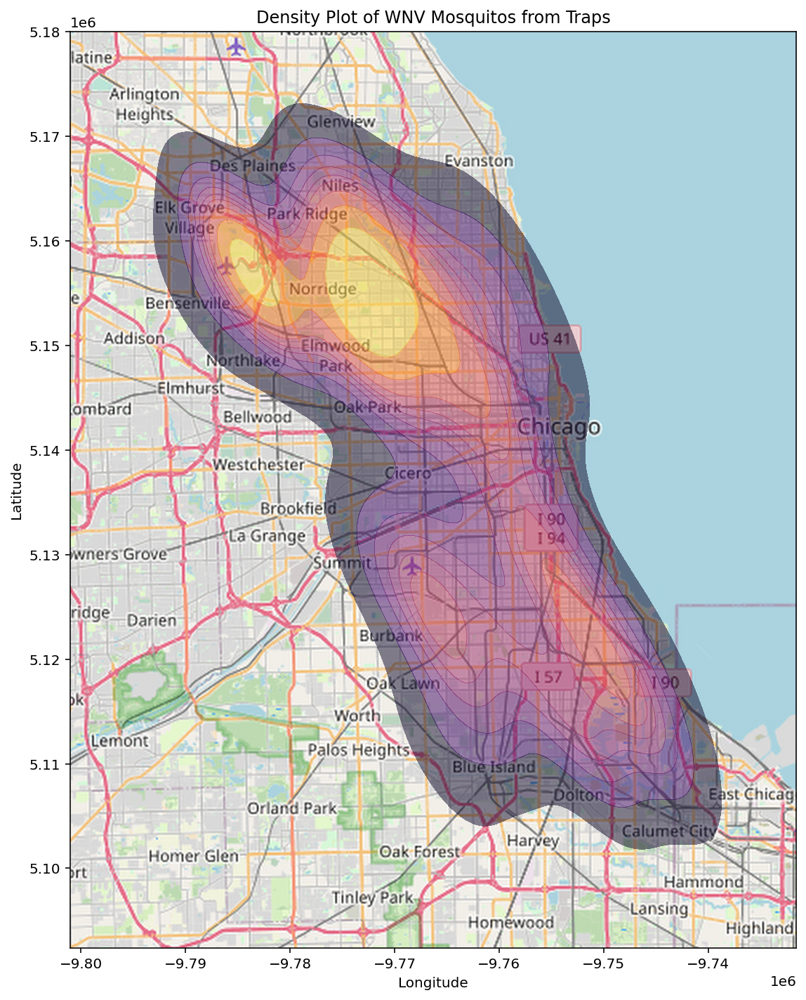

In [ ]:
# density plot of WNV mosquito count from traps
t = tilemapbase.tiles.build_OSM()
fig,ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)
density_plot = sns.kdeplot(
                wnv_present['geometry'].x,
                wnv_present['geometry'].y,
                shade=True,
                alpha=0.5,
                cmap="inferno",
                shade_lowest=False,
                zorder=3
                )
plt.title("Density Plot of WNV Mosquitos from Traps")
plt.xlabel("Longitude")
plt.ylabel("Latitude")

From the map above, we can see that there are 2 main hotspots with high density of WNV mosquitos

### Pesticide Spraying and All Mosquito Presence 

In [ ]:
spray_df.head()

,date,time,latitude,longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [ ]:
spray_geometry = [Point(xy) for xy in zip( spray_df['longitude'], spray_df['latitude'])]
spraygeo_df = gpd.GeoDataFrame(spray_df,                     
                         geometry=spray_geometry)
spraygeo_df.head()

,date,time,latitude,longitude,geometry
0,2011-08-29,6:56:58 PM,42.391623,-88.089163,POINT (-88.08916 42.39162)
1,2011-08-29,6:57:08 PM,42.391348,-88.089163,POINT (-88.08916 42.39135)
2,2011-08-29,6:57:18 PM,42.391022,-88.089157,POINT (-88.08916 42.39102)
3,2011-08-29,6:57:28 PM,42.390637,-88.089158,POINT (-88.08916 42.39064)
4,2011-08-29,6:57:38 PM,42.390410,-88.088858,POINT (-88.08886 42.39041)


In [ ]:
spraygeo_df = spraygeo_df.set_crs('epsg:4326')
spraygeo_df = spraygeo_df.to_crs("EPSG:3857")

In [ ]:
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(street_map, buffer = 25)

Text(0, 0.5, 'Latitude')

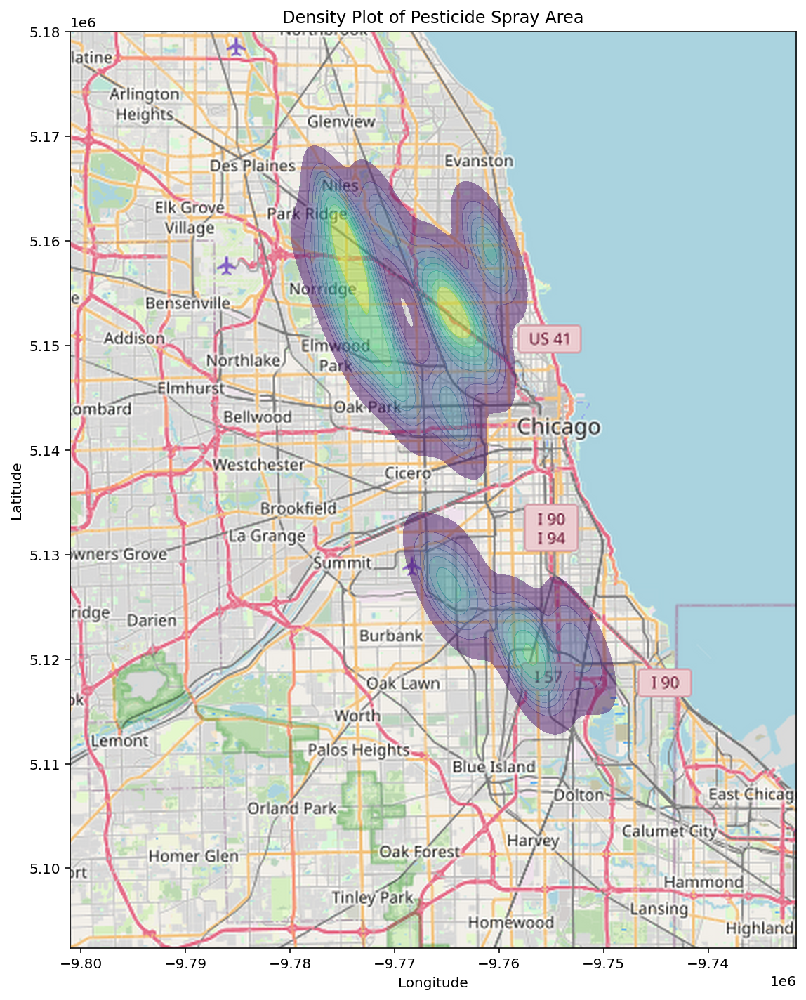

In [ ]:
# density plot for SPRAY area
t = tilemapbase.tiles.build_OSM()
fig,ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)
density_plot = sns.kdeplot(
                spraygeo_df['geometry'].x,
                spraygeo_df['geometry'].y,
                shade=True,
                alpha=0.5,
                cmap="viridis",
                shade_lowest=False,
                zorder=3
                )
plt.title("Density Plot of Pesticide Spray Area")
plt.xlabel("Longitude")
plt.ylabel("Latitude")

From the map, it can be seen that only specific areas in Chicago are sprayed with pesticide. We will explore later on whether this covers all the areas with WNV mosquitos

### Pesticide Spraying and WMV Mosquito Presence 

Text(0, 0.5, 'Latitude')

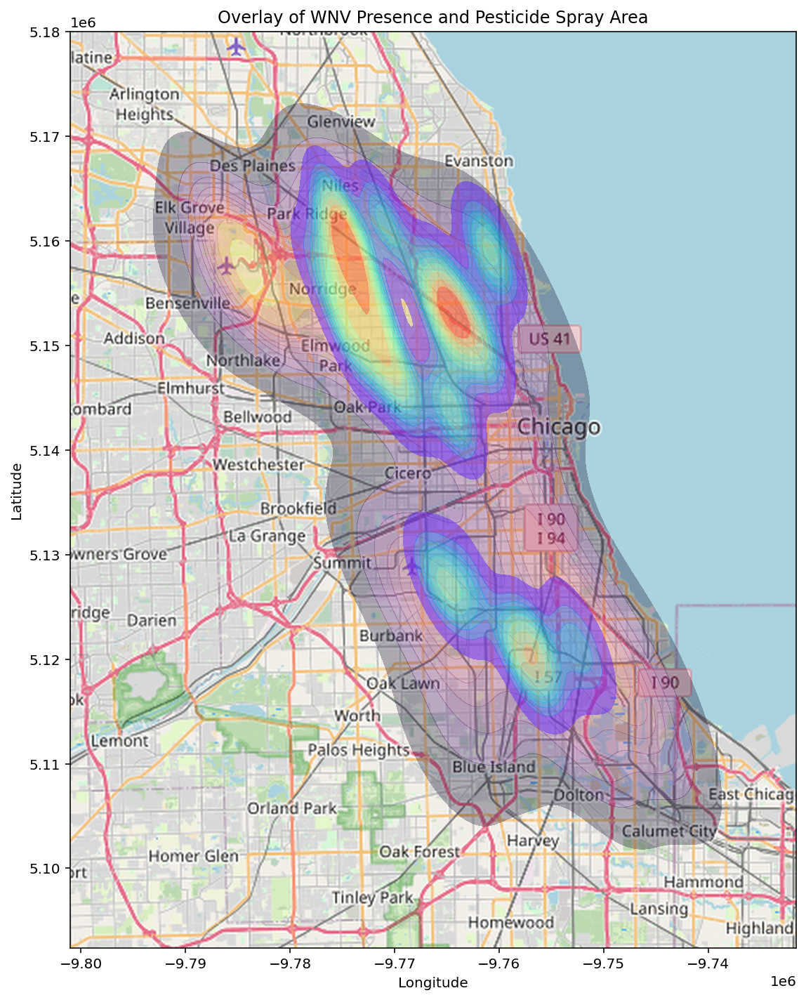

In [ ]:
# overlay of spray and WNV presence density plots

t = tilemapbase.tiles.build_OSM()
fig,ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)
density_plot = sns.kdeplot(
                wnv_present['geometry'].x,
                wnv_present['geometry'].y,
                shade=True,
                alpha=0.3,
                cmap="inferno",
                shade_lowest=False,
                zorder=3
                )
density_plot = sns.kdeplot(
                spraygeo_df['geometry'].x,
                spraygeo_df['geometry'].y,
                shade=True,
                alpha=0.5,
                cmap="rainbow",
                shade_lowest=False,
                zorder=3
                )
plt.title("Overlay of WNV Presence and Pesticide Spray Area")
plt.xlabel("Longitude")
plt.ylabel("Latitude")


Based on the overlay of the two areas, we can see that the area at the top left corner has a high density of WNV but is not covered by pesticide. As part of our recommendations later on, this area should be covered by pesticide as well.es

## Feature variables

###  Weather Variables

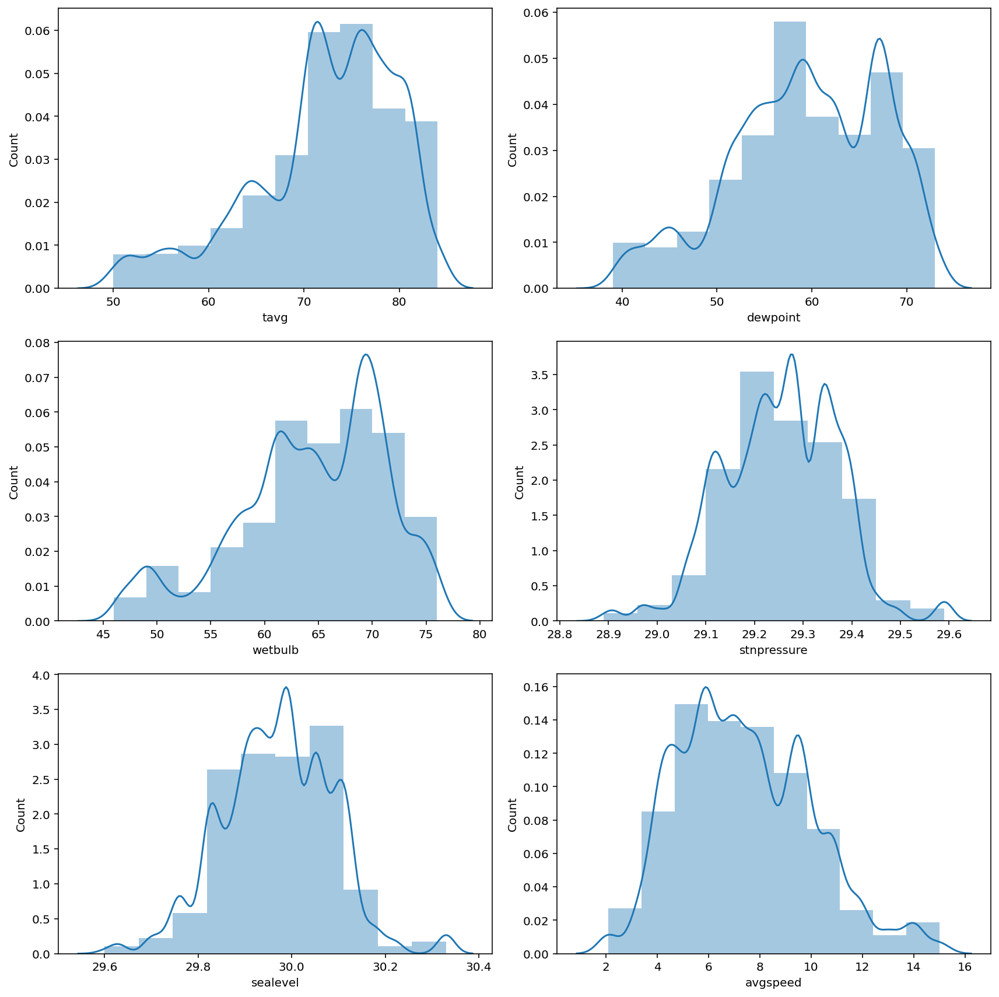

In [ ]:
def plotting(df, columns, num_cols=2):
    fig = plt.figure(figsize=(6*num_cols,4*round(len(columns)/num_cols)))
    for col_number, col_name in enumerate(columns):   
        fig.add_subplot(math.ceil(len(columns)/num_cols), num_cols, col_number + 1)
        sns.distplot(df[col_name],bins=10)
        plt.ylabel('Count')
    fig.tight_layout()
    
plotting(combined_df, [ 'tavg', 'dewpoint', 'wetbulb', 'stnpressure', 'sealevel', 'avgspeed'])

### Total Precipitation

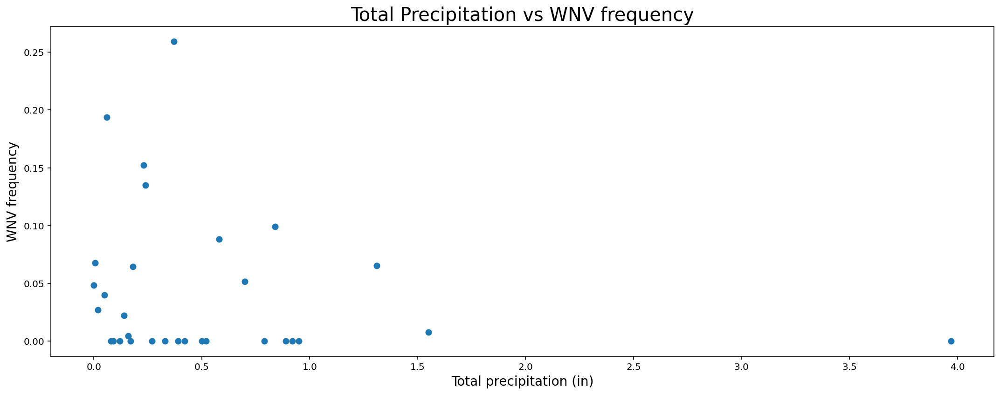

In [ ]:
#create an empty list
precip_list = []

#create a for loop that create a correlation point between how much water is in the space to the frequency of WNV affected mosquitos
for i in list(set(combined_df.preciptotal.values)):
    precip_list.append(combined_df[combined_df.preciptotal == i]['wnvpresent'].mean())

#create scattlerplot to represent the relation between WNV to height in water level
plt.figure(figsize=(15, 6))
plt.scatter(list(set(combined_df.preciptotal.values)), precip_list)
plt.xlabel('Total precipitation (in)', size=14)
plt.ylabel('WNV frequency', size=14)
plt.title('Total Precipitation vs WNV frequency', size=20)
plt.tight_layout()

The illustration shows that the ground surface does not need too much water to be able to breed mosquitos. Excessive rainfall can cause breeding sites to overflow, disrupting mosquito breeding and destroying developing larvae, which could explain why there is hardly any mosquitos trapped at higher precipitation levels. Although the percentage of those incubated mosquito larve being a carrier of MNV is at max 25% (0.25). It does indicate that 1 out of 4 new borns will be able to affect many neighboring foot traffic if the city do not do proper spray or place traps early.

### Dewpoint

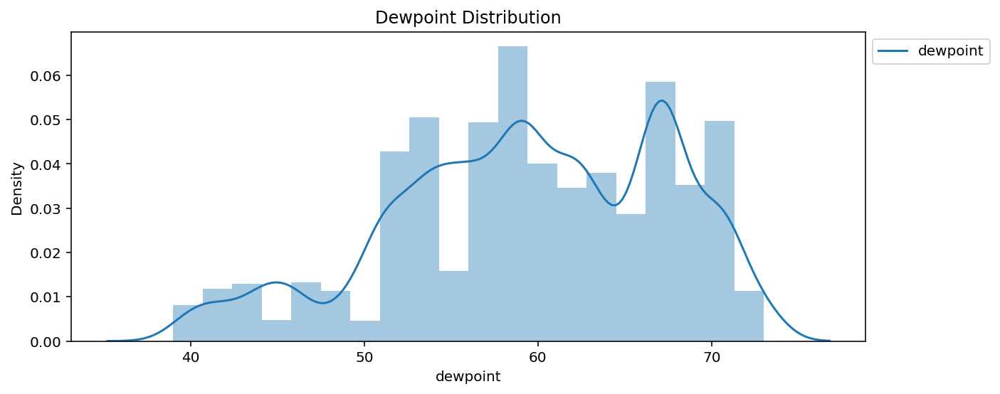

Based on this plot, dewpoint is has a poor normal distribution. We will attempt to correct the normality by doing a 
log transformation


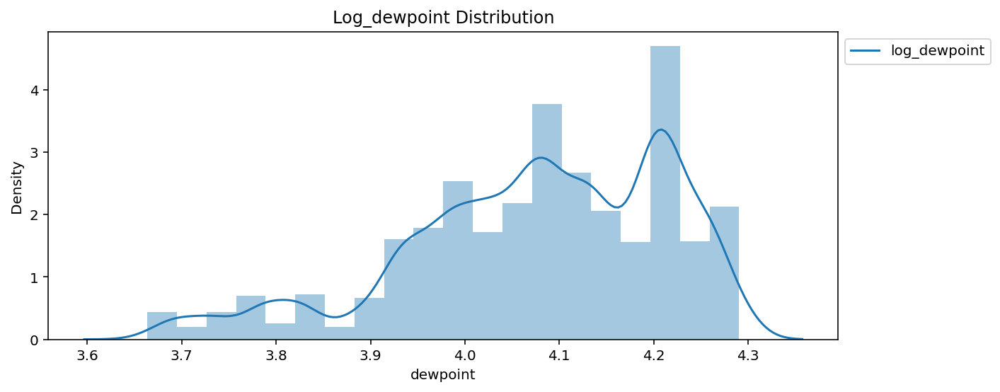

Even after conducting the log-transformation, the distribution is still far from normal. We will attempt to 
ordinalise this feature to see if there is better correlation with WNV virus


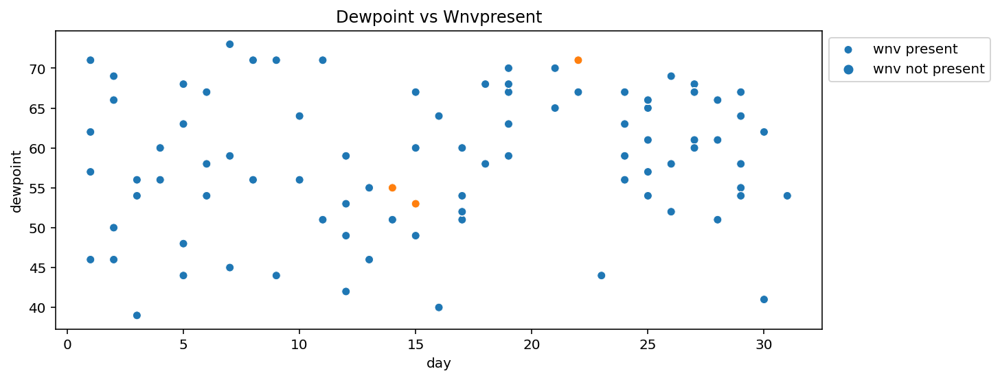

No patterns were detected base on this scatterplot


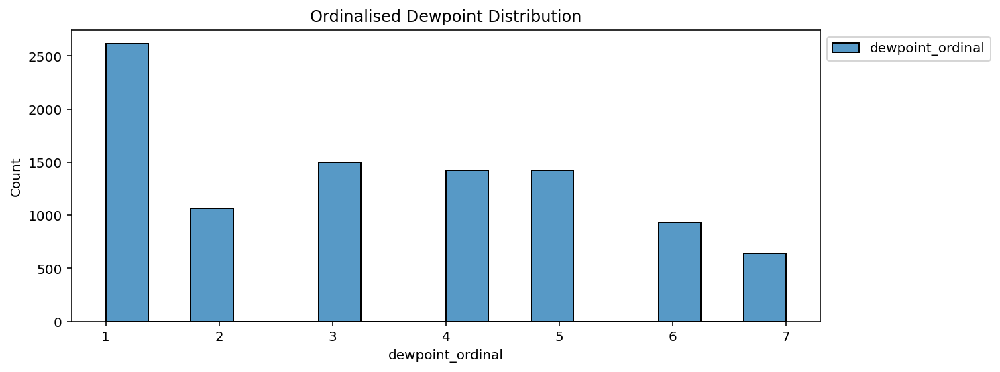

The correlation between dewpoint and wnvpresent is  0.09285619543530467
The correlation between dewpoint and mosquitoes is  0.10303941738593894
The correlation between ordinalised dewpoint and wnvpresent is  0.08223251091932647
The correlation between ordinalised wetbulb and mosquitoes is  0.08451995224964896

After conduction ordinalisation, pattern is detected and correlation remains poor. 
Thus, dewpoint may not be a good predictor


Index(['date', 'species', 'block', 'street', 'trap', 'latitude', 'longitude',
       'addressaccuracy', 'nummosquitos', 'wnvpresent', 'tavg', 'dewpoint',
       'wetbulb', 'codesum', 'preciptotal', 'stnpressure', 'sealevel',
       'resultspeed', 'resultdir', 'avgspeed', 'year', 'month', 'day',
       'geometry'],
      dtype='object')

In [ ]:
# Dewpoint EDA + Feature Engineering

# Check the distribution of dewpoint and whether log-transformation improves the distribution towards normal.
# Both dewpoint and log-transformed dewpoint have very poor distribution with respect to normal.

fig, ax = plt.subplots(figsize=(10,4))
sns.distplot(combined_df['dewpoint'],bins=20, ax=ax).set(title="Dewpoint Distribution")

plt.legend(labels=["dewpoint"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("Based on this plot, dewpoint is has a poor normal distribution. We will attempt to correct the normality by doing a \nlog transformation")

fig, ax = plt.subplots(figsize=(10,4))
sns.distplot(np.log(combined_df['dewpoint']),bins=20, ax=ax).set(title = "Log_dewpoint Distribution")
plt.legend(labels=["log_dewpoint"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("Even after conducting the log-transformation, the distribution is still far from normal. We will attempt to \nordinalise this feature to see if there is better correlation with WNV virus")

# Check if dewpoint is correlated with WNV presence

fig, ax = plt.subplots(figsize=(10,4))
sns.scatterplot(data=combined_df, x="day", y="dewpoint", hue="wnvpresent").set(title = "Dewpoint vs Wnvpresent")
plt.legend(labels=["wnv present","wnv not present"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("No patterns were detected base on this scatterplot")

# The correlation between dewpoint and wnv is about 0.08, which is very low.

# Perform ordinalisation of dewpoint at quartile-cut offs
# Check if ordinalised dewpoint gives better distribution and correlation with WNV

combined_df["dewpoint_ordinal"] = combined_df["dewpoint"]

combined_df["dewpoint_ordinal"].describe()
combined_df["dewpoint_ordinal"] = pd.cut(combined_df["dewpoint_ordinal"],bins=[0,7,54,57,60,64,67,70,73],labels=[0,1,2,3,4,5,6,7])
combined_df["dewpoint_ordinal"] = combined_df["dewpoint_ordinal"].astype(float)

fig, ax = plt.subplots(figsize=(10,4))
sns.histplot(combined_df['dewpoint_ordinal'], ax=ax).set(title = "Ordinalised Dewpoint Distribution")
plt.legend(labels=["dewpoint_ordinal"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("The correlation between dewpoint and wnvpresent is ", combined_df['dewpoint'].corr(combined_df['wnvpresent']))
print("The correlation between dewpoint and mosquitoes is ", combined_df["dewpoint"].corr(combined_df['nummosquitos']))
print("The correlation between ordinalised dewpoint and wnvpresent is ", combined_df['dewpoint_ordinal'].corr(combined_df['wnvpresent']))
print("The correlation between ordinalised wetbulb and mosquitoes is ", combined_df["dewpoint_ordinal"].corr(combined_df['nummosquitos']))


print("\nAfter conduction ordinalisation, pattern is detected and correlation remains poor. \nThus, dewpoint may not be a good predictor")

# Dewpoint is a poor predictor of wnv and has poor normal distribution
# Reset the combined_df back to original

combined_df.drop(["dewpoint_ordinal"], axis=1, inplace=True)
combined_df.columns

### Wetbulb

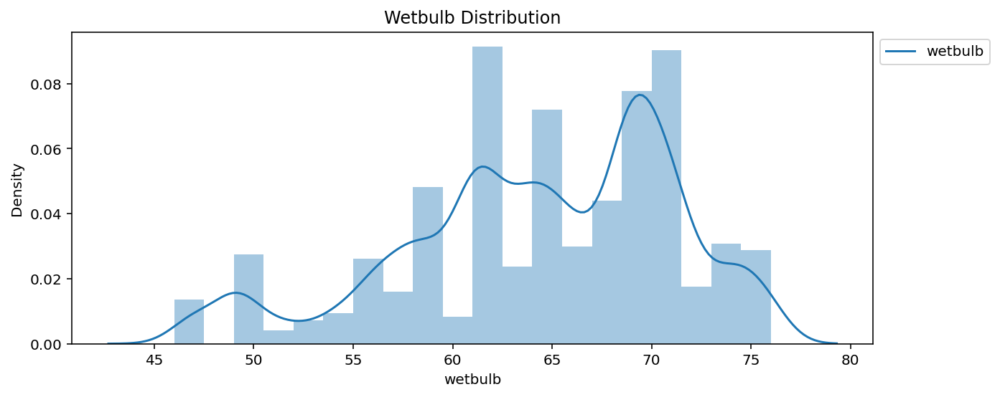

Based on this plot, wetbulb also has a poor normal distribution and is similar to dewpoint. We will attempt to correct the normality by doing a log transformation


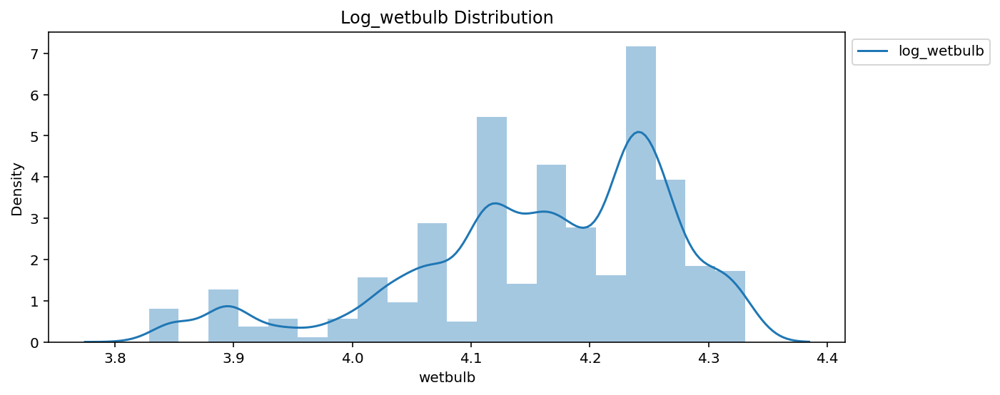

Even after conducting the log-transformation, the distribution is still far from normal. We will attempt to ordinalise this feature to see if there is better correlation with WNV virus


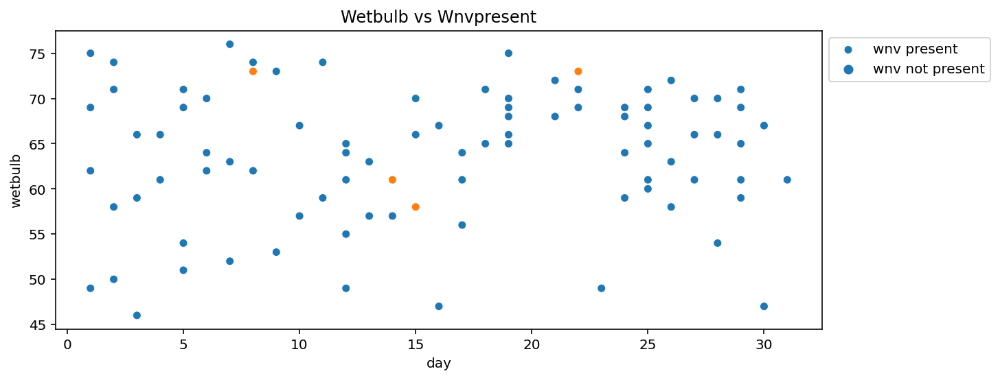

No patterns were detected base on this scatterplot


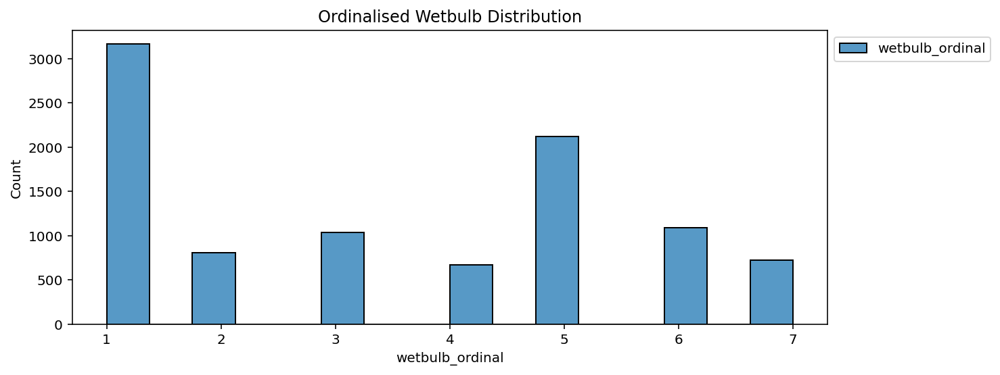

The correlation between wetbulb and wnvpresent is  0.08742140285583153
The correlation between wetbulb and mosquitoes is  0.11901229069799188
The correlation between ordinalised wetbulb and wnvpresent is  0.07952313415584612
The correlation between ordinalised wetbulb and mosquitoes is  0.09544650635121903
After conduction ordinalisation, pattern is detected and correlation remains poor. Thus, wetbulb may not be a good predictor


Index(['date', 'species', 'block', 'street', 'trap', 'latitude', 'longitude',
       'addressaccuracy', 'nummosquitos', 'wnvpresent', 'tavg', 'dewpoint',
       'wetbulb', 'codesum', 'preciptotal', 'stnpressure', 'sealevel',
       'resultspeed', 'resultdir', 'avgspeed', 'year', 'month', 'day',
       'geometry'],
      dtype='object')

In [ ]:
# Wetbulb EDA + Feature Engineering

# Check the distribution of wet bulb and whether log-transformation improves the distribution towards normal.
# Both wetbulb and log-transformed dewpoint have very poor distribution with respect to normal.

fig, ax = plt.subplots(figsize=(10,4))
sns.distplot(combined_df['wetbulb'],bins=20, ax=ax).set(title="Wetbulb Distribution")

plt.legend(labels=["wetbulb"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("Based on this plot, wetbulb also has a poor normal distribution and is similar to dewpoint. We will attempt to correct the normality by doing a log transformation")

fig, ax = plt.subplots(figsize=(10,4))
sns.distplot(np.log(combined_df['wetbulb']),bins=20, ax=ax).set(title = "Log_wetbulb Distribution")
plt.legend(labels=["log_wetbulb"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("Even after conducting the log-transformation, the distribution is still far from normal. We will attempt to ordinalise this feature to see if there is better correlation with WNV virus")

# Check if wetbulb is correlated with WNV presence

fig, ax = plt.subplots(figsize=(10,4))
sns.scatterplot(data=combined_df, x="day", y="wetbulb", hue="wnvpresent").set(title = "Wetbulb vs Wnvpresent")
plt.legend(labels=["wnv present","wnv not present"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("No patterns were detected base on this scatterplot")

# The correlation between wetbulb and wnv is about 0.08, which is very low.

# Perform ordinalisation of wetbulb at quartile-cut offs
# Check if ordinalised wetbulb gives better distribution and correlation with WNV

combined_df["wetbulb_ordinal"] = combined_df["wetbulb"]

combined_df["wetbulb_ordinal"].describe()
combined_df["wetbulb_ordinal"] = pd.cut(combined_df["wetbulb_ordinal"],bins=[0,30,61,63,65,67,70,73,76],labels=[0,1,2,3,4,5,6,7])
combined_df["wetbulb_ordinal"] = combined_df["wetbulb_ordinal"].astype(float)

fig, ax = plt.subplots(figsize=(10,4))
sns.histplot(combined_df['wetbulb_ordinal'], ax=ax).set(title = "Ordinalised Wetbulb Distribution")
plt.legend(labels=["wetbulb_ordinal"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("The correlation between wetbulb and wnvpresent is ", combined_df['wetbulb'].corr(combined_df['wnvpresent']))
print("The correlation between wetbulb and mosquitoes is ", combined_df["wetbulb"].corr(combined_df['nummosquitos']))
print("The correlation between ordinalised wetbulb and wnvpresent is ", combined_df['wetbulb_ordinal'].corr(combined_df['wnvpresent']))
print("The correlation between ordinalised wetbulb and mosquitoes is ", combined_df["wetbulb_ordinal"].corr(combined_df['nummosquitos']))

print("After conduction ordinalisation, pattern is detected and correlation remains poor. Thus, wetbulb may not be a good predictor")

# Wetbulb is a poor predictor of wnv and has poor normal distribution
# Reset the combined_df back to original

combined_df.drop(["wetbulb_ordinal"], axis=1, inplace=True)
combined_df.columns

### Station Pressure

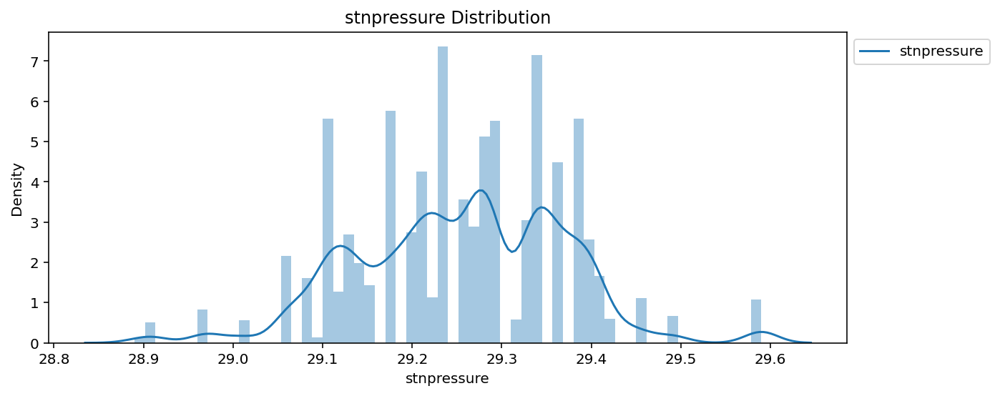

Based on this plot, stnpressure also has a poor normal distribution and is similar to dewpoint. We will attempt to correct the normality by doing a log transformation


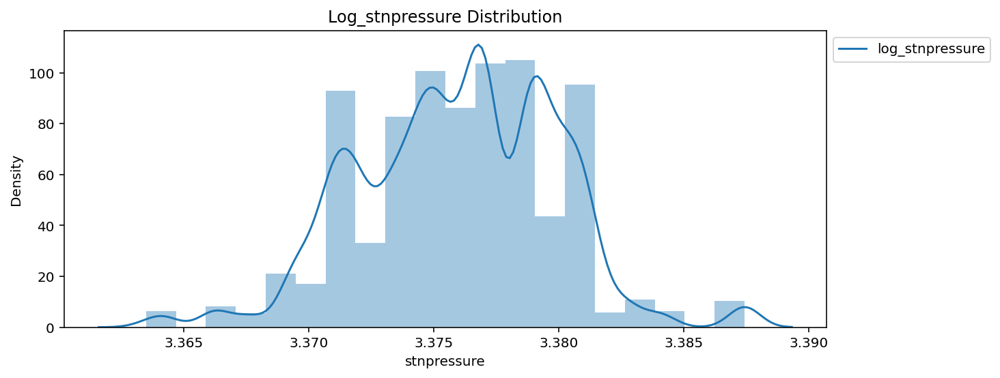

Even after conducting the log-transformation, the distribution is still far from normal. We will attempt to ordinalise this feature to see if there is better correlation with WNV virus


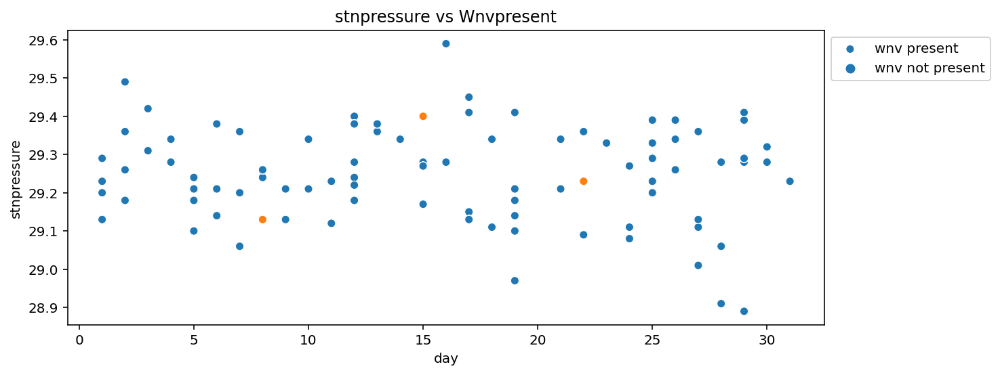

No patterns were detected base on this scatterplot


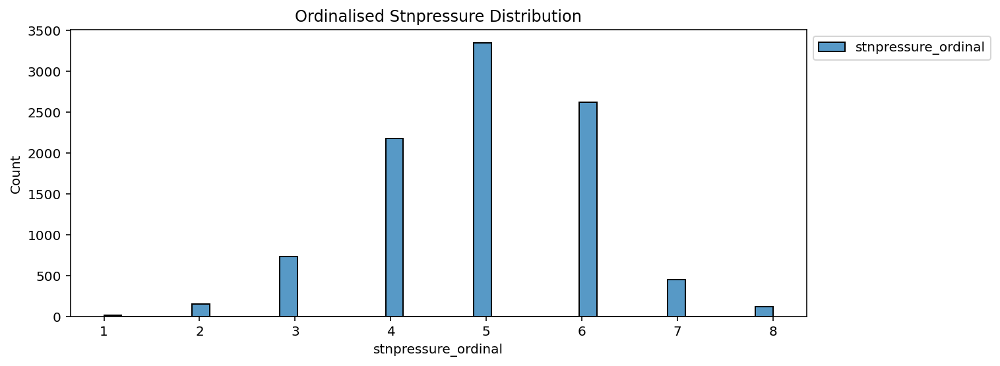

The correlation between stnpressure and wnvpresent is  0.004359551211526196
The correlation between stnpressure and mosquitoes is  -0.021812970826654607
The correlation between ordinalised stnpressure and wnvpresent is  0.004359551211526196
The correlation between ordinalised stnpressure and mosquitoes is  -0.021812970826654607
After conduction ordinalisation, distribution becomes more normal but correlation remains poor.


Index(['date', 'species', 'block', 'street', 'trap', 'latitude', 'longitude',
       'addressaccuracy', 'nummosquitos', 'wnvpresent', 'tavg', 'dewpoint',
       'wetbulb', 'codesum', 'preciptotal', 'stnpressure', 'sealevel',
       'resultspeed', 'resultdir', 'avgspeed', 'year', 'month', 'day',
       'geometry'],
      dtype='object')

In [ ]:
# Stationpressure EDA and feature engineering 

# Check the distribution of stationpressure and whether log-transformation improves the distribution towards normal.
# Both stnpressure and log-transformed stnpressure have very poor distribution with respect to normal.

fig, ax = plt.subplots(figsize=(10,4))
sns.distplot(combined_df['stnpressure'],bins=60, ax=ax).set(title="stnpressure Distribution")

plt.legend(labels=["stnpressure"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("Based on this plot, stnpressure also has a poor normal distribution and is similar to dewpoint. We will attempt to correct the normality by doing a log transformation")

fig, ax = plt.subplots(figsize=(10,4))
sns.distplot(np.log(combined_df['stnpressure']),bins=20, ax=ax).set(title = "Log_stnpressure Distribution")
plt.legend(labels=["log_stnpressure"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("Even after conducting the log-transformation, the distribution is still far from normal. We will attempt to ordinalise this feature to see if there is better correlation with WNV virus")

# Check if stnpressure is correlated with WNV presence

fig, ax = plt.subplots(figsize=(10,4))
sns.scatterplot(data=combined_df, x="day", y="stnpressure", hue="wnvpresent").set(title = "stnpressure vs Wnvpresent")
plt.legend(labels=["wnv present","wnv not present"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("No patterns were detected base on this scatterplot")

# The correlation between stnpressure and wnv is about 0.08, which is very low.

# Perform ordinalisation of stnpressure at quartile-cut offs
# Check if ordinalised stnpressure gives better distribution and correlation with WNV

combined_df["stnpressure_ordinal"] = combined_df["stnpressure"]

combined_df["stnpressure_ordinal"].describe()
combined_df["stnpressure_ordinal"] = pd.cut(combined_df["stnpressure_ordinal"],bins=[0,28.8,28.9,29,29.1,29.2,29.3,29.4,29.5,29.6],labels=[0,1,2,3,4,5,6,7,8])
combined_df["stnpressure_ordinal"] = combined_df["stnpressure_ordinal"].astype(float)

fig, ax = plt.subplots(figsize=(10,4))
sns.histplot(combined_df['stnpressure_ordinal'], ax=ax).set(title = "Ordinalised Stnpressure Distribution")
plt.legend(labels=["stnpressure_ordinal"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("The correlation between stnpressure and wnvpresent is ", combined_df['stnpressure'].corr(combined_df['wnvpresent']))
print("The correlation between stnpressure and mosquitoes is ", combined_df["stnpressure"].corr(combined_df['nummosquitos']))
print("The correlation between ordinalised stnpressure and wnvpresent is ", combined_df['stnpressure'].corr(combined_df['wnvpresent']))
print("The correlation between ordinalised stnpressure and mosquitoes is ", combined_df["stnpressure"].corr(combined_df['nummosquitos']))

print("After conduction ordinalisation, distribution becomes more normal but correlation remains poor.")

# stnpressure is a poor predictor of wnv and has poor normal distribution
# Reset the combined_df back to original

combined_df.drop(["stnpressure_ordinal"], axis=1, inplace=True)
combined_df.columns

### Sea Level

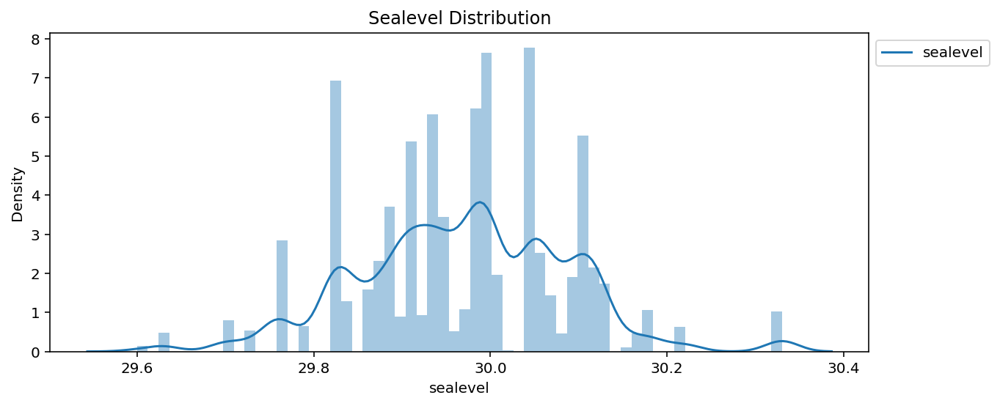

Based on this plot, sealevel also has a poor normal distribution and is similar to dewpoint. We will attempt to correct the normality by doing a log transformation


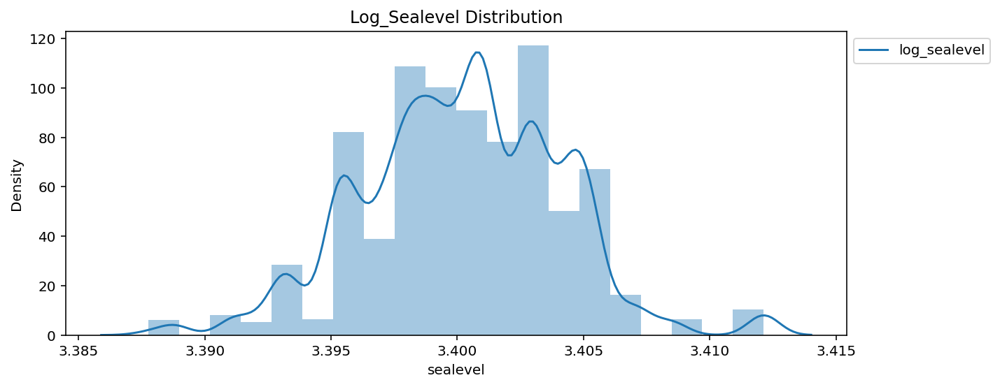

Even after conducting the log-transformation, the distribution is still far from normal. We will attempt to ordinalise this feature to see if there is better correlation with WNV virus


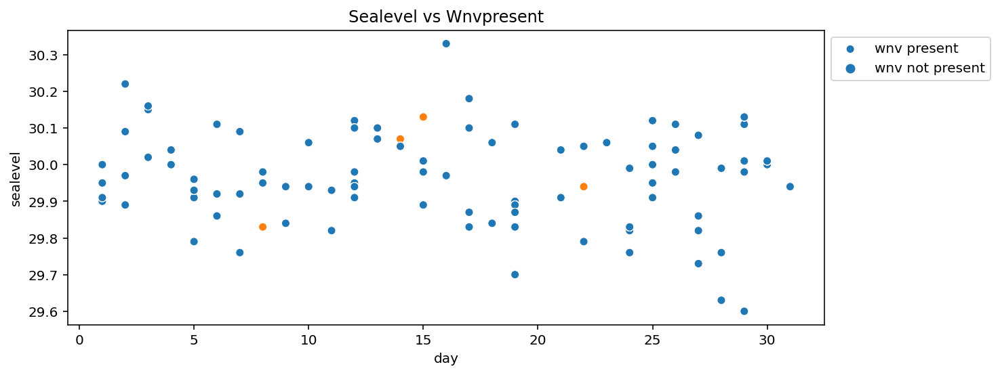

No patterns were detected base on this scatterplot
count    9601.000000
mean       29.969213
std         0.117462
min        29.600000
25%        29.890000
50%        29.980000
75%        30.050000
max        30.330000
Name: sealevel_ordinal, dtype: float64


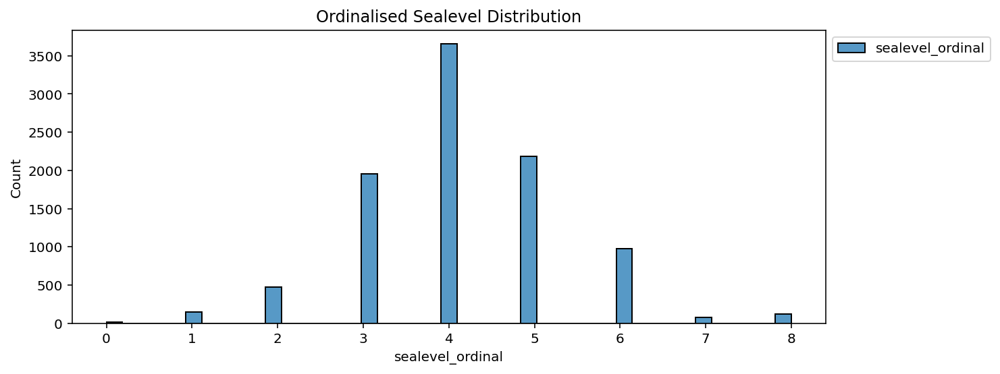

The correlation between sealevel and wnvpresent is  0.08742140285583153
The correlation between sealevel and mosquitoes is  0.11901229069799188
The correlation between ordinalised sealevel and wnvpresent is  0.001536506754353718
The correlation between ordinalised sealevel and mosquitoes is  -0.026555810138552627
After conduction ordinalisation, distribution becomes more normal but correlation remains poor.


Index(['date', 'species', 'block', 'street', 'trap', 'latitude', 'longitude',
       'addressaccuracy', 'nummosquitos', 'wnvpresent', 'tavg', 'dewpoint',
       'wetbulb', 'codesum', 'preciptotal', 'stnpressure', 'sealevel',
       'resultspeed', 'resultdir', 'avgspeed', 'year', 'month', 'day',
       'geometry'],
      dtype='object')

In [ ]:
# Sealevel EDA and feature engineering 

# Check the distribution of stationpressure and whether log-transformation improves the distribution towards normal.
# Both stnpressure and log-transformed stnpressure have very poor distribution with respect to normal.

fig, ax = plt.subplots(figsize=(10,4))
sns.distplot(combined_df['sealevel'],bins=60, ax=ax).set(title="Sealevel Distribution")

plt.legend(labels=["sealevel"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("Based on this plot, sealevel also has a poor normal distribution and is similar to dewpoint. We will attempt to correct the normality by doing a log transformation")

fig, ax = plt.subplots(figsize=(10,4))
sns.distplot(np.log(combined_df['sealevel']),bins=20, ax=ax).set(title = "Log_Sealevel Distribution")
plt.legend(labels=["log_sealevel"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("Even after conducting the log-transformation, the distribution is still far from normal. We will attempt to ordinalise this feature to see if there is better correlation with WNV virus")

# Check if stnpressure is correlated with WNV presence

fig, ax = plt.subplots(figsize=(10,4))
sns.scatterplot(data=combined_df, x="day", y="sealevel", hue="wnvpresent").set(title = "Sealevel vs Wnvpresent")
plt.legend(labels=["wnv present","wnv not present"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("No patterns were detected base on this scatterplot")

# The correlation between stnpressure and wnv is about 0.08, which is very low.

# Perform ordinalisation of stnpressure at quartile-cut offs
# Check if ordinalised stnpressure gives better distribution and correlation with WNV

combined_df["sealevel_ordinal"] = combined_df["sealevel"]

print(combined_df["sealevel_ordinal"].describe())
combined_df["sealevel_ordinal"] = pd.cut(combined_df["sealevel_ordinal"],bins=[0,29.6,29.7,29.8,29.9,30,30.1,30.2,30.3,30.4],labels=[0,1,2,3,4,5,6,7,8])
combined_df["sealevel_ordinal"] = combined_df["sealevel_ordinal"].astype(float)

fig, ax = plt.subplots(figsize=(10,4))
sns.histplot(combined_df['sealevel_ordinal'], ax=ax).set(title = "Ordinalised Sealevel Distribution")
plt.legend(labels=["sealevel_ordinal"], loc = 2, bbox_to_anchor = (1,1))

plt.show()

print("The correlation between sealevel and wnvpresent is ", combined_df['wetbulb'].corr(combined_df['wnvpresent']))
print("The correlation between sealevel and mosquitoes is ", combined_df["wetbulb"].corr(combined_df['nummosquitos']))
print("The correlation between ordinalised sealevel and wnvpresent is ", combined_df['sealevel'].corr(combined_df['wnvpresent']))
print("The correlation between ordinalised sealevel and mosquitoes is ", combined_df["sealevel"].corr(combined_df['nummosquitos']))

print("After conduction ordinalisation, distribution becomes more normal but correlation remains poor.")

# stnpressure is a poor predictor of wnv and has poor normal distribution
# Reset the combined_df back to original

combined_df.drop(["sealevel_ordinal"], axis=1, inplace=True)
combined_df.columns

### T-average

<AxesSubplot:xlabel='tavg', ylabel='Count'>

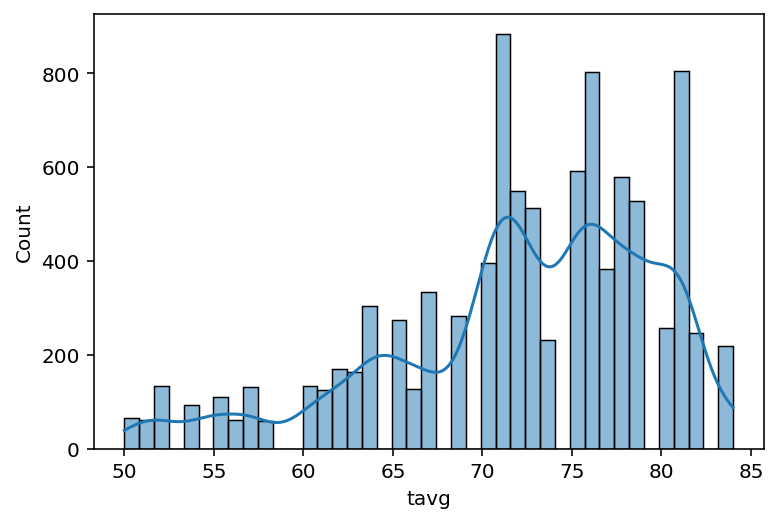

In [ ]:
#tavg

sns.histplot(data=combined_df, x='tavg', kde=True)

Among our dataset, most of the datapoints had an average temperature of around 70-80 fahrenheit. We will take a further look into the average temperature at each individual years, against our target variable of the presence of West Nile Virus.

<AxesSubplot:xlabel='tavg', ylabel='wnvpresent'>

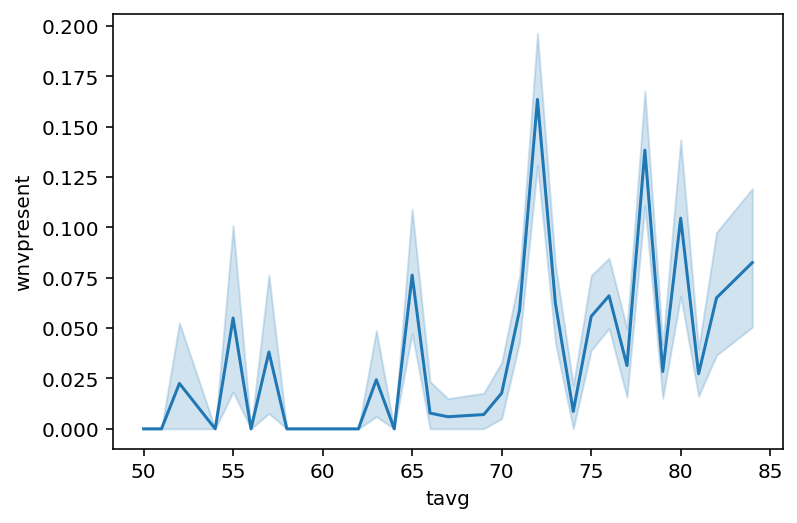

In [ ]:
sns.lineplot(data=combined_df, x="tavg", y="wnvpresent")

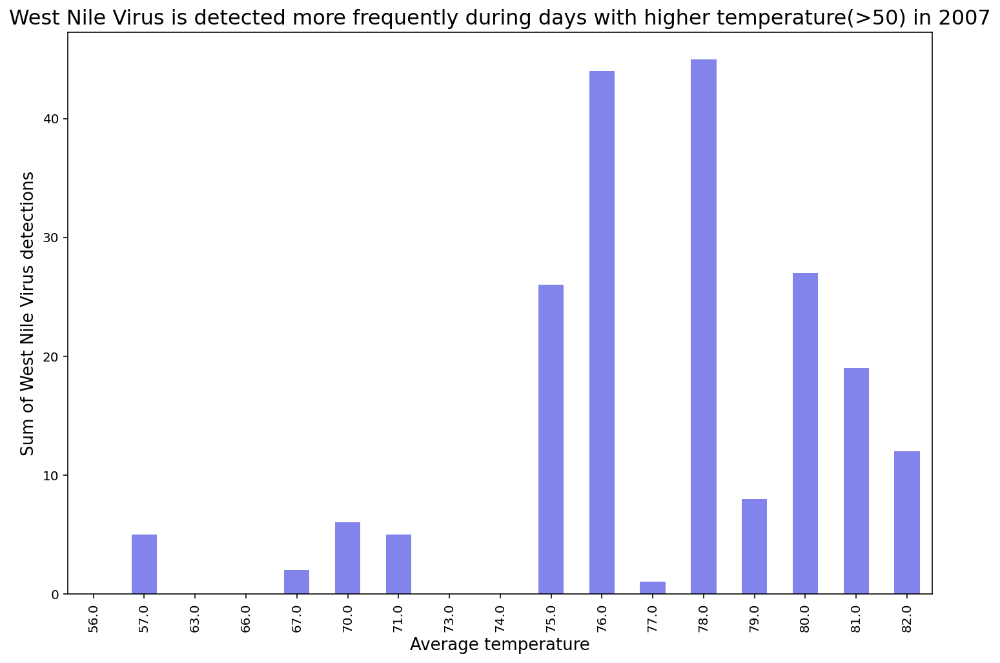

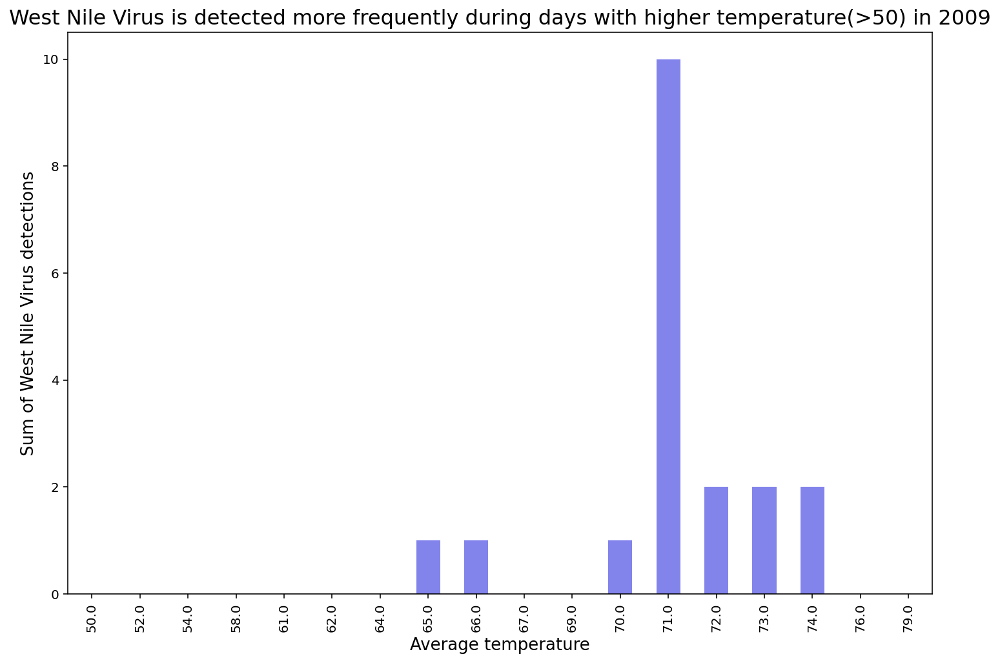

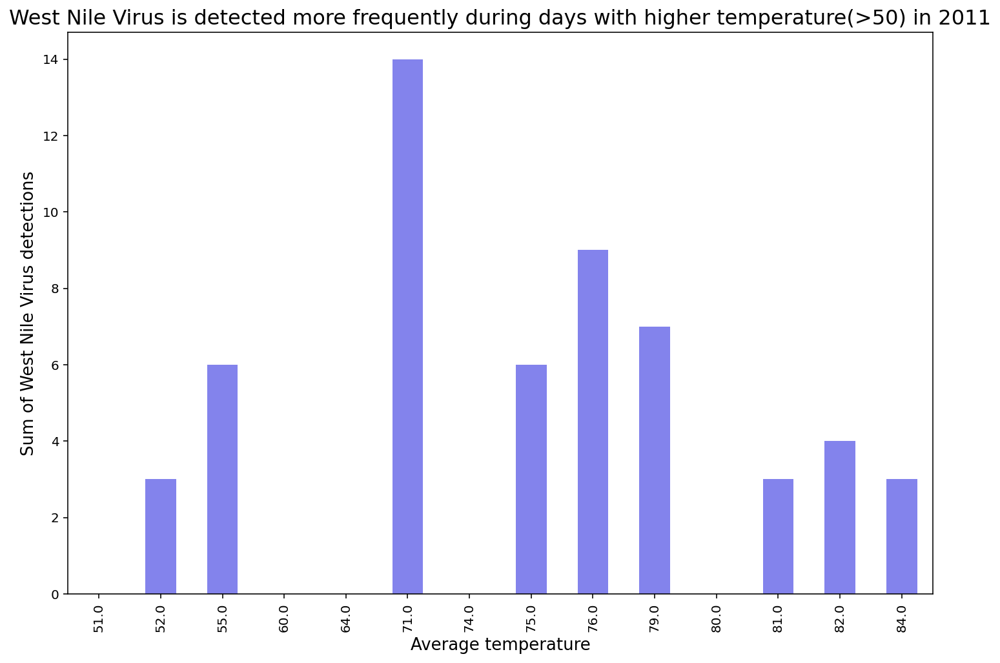

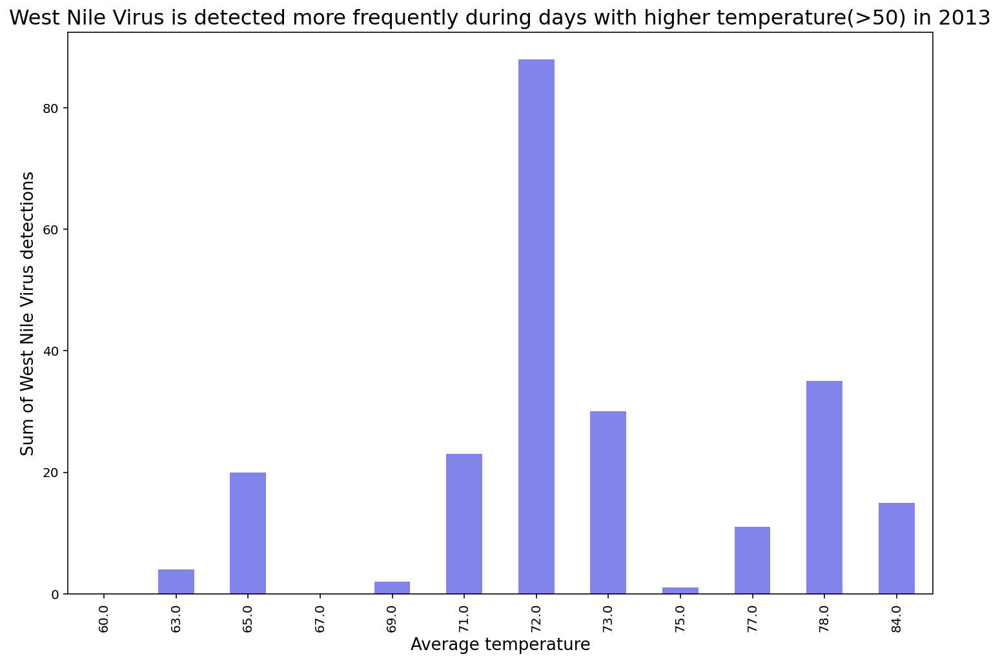

In [ ]:
for x in combined_df['year'].unique():
    plt.figure(figsize=(12,8))
    combined_df[combined_df['year']==x].groupby(['tavg'])['wnvpresent'].sum().plot.bar(color='#8383EC') 
    plt.title(f"West Nile Virus is detected more frequently during days with higher temperature(>50) in {x}", fontsize=16)
    plt.xlabel("Average temperature", fontsize =13)
    plt.xticks(rotation=90)
    plt.ylabel("Sum of West Nile Virus detections", fontsize=13)

The West Nile Virus is most detected at an average temperature of around 71-75 fahrenheit across years 2007, 2009, 2011, and 2013. This suggests that this might be the optimal range of temperature for the mosquitos carrying West Nile Virus to breed. We will do further analysis later to see if temperature is an important feature for the presence of West Nile Virus.

### Result speed

<AxesSubplot:xlabel='resultspeed', ylabel='Count'>

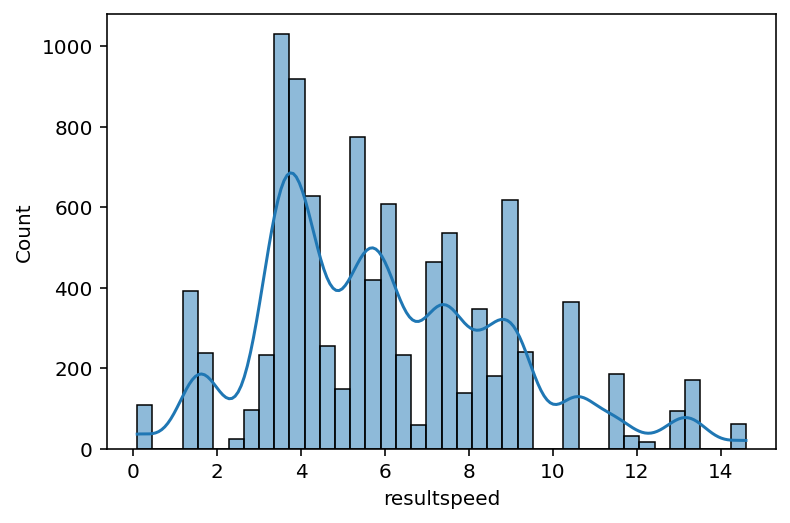

In [ ]:
#resultspeed

sns.histplot(data=combined_df, x='resultspeed', kde=True)

Most of our dataset has an average wind resulting speed of 4 miles per hour. We will see the the average wind resulting speed's relationship with the presence of the West Nile Virus.

<AxesSubplot:xlabel='resultspeed', ylabel='wnvpresent'>

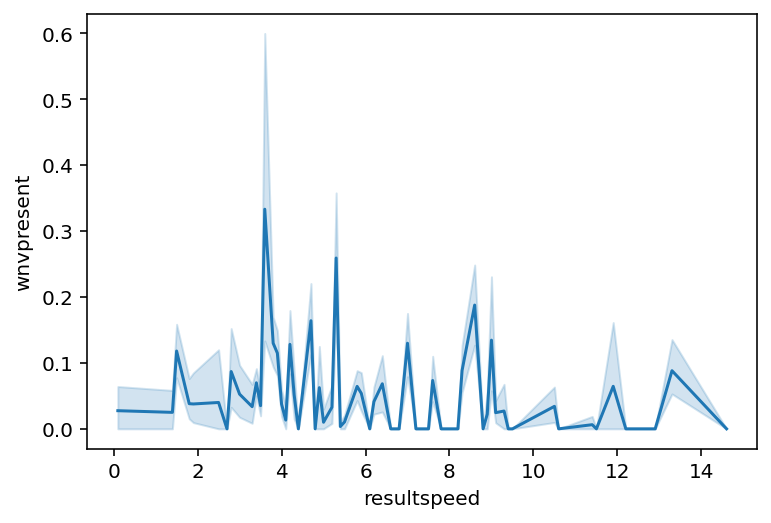

In [ ]:
sns.lineplot(data=combined_df, x="resultspeed", y="wnvpresent")

The above plot shows that the presence of the West Nile Virus is most observed at the optimal average resulting wind speed of 4 miles per hour.

### Average speed

<AxesSubplot:xlabel='avgspeed', ylabel='Count'>

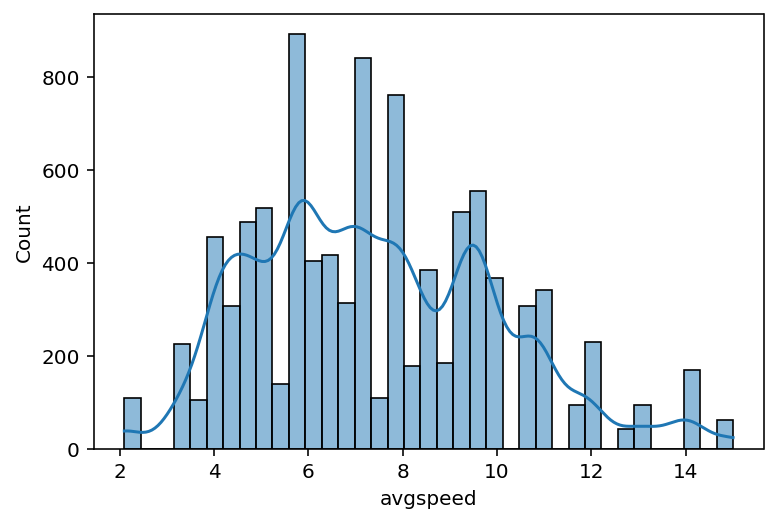

In [ ]:
#avgspeed

sns.histplot(data=combined_df, x='avgspeed', kde=True)

From our dataset, the wind has an average speed of around 4-10 miles per hour. 

<AxesSubplot:xlabel='avgspeed', ylabel='wnvpresent'>

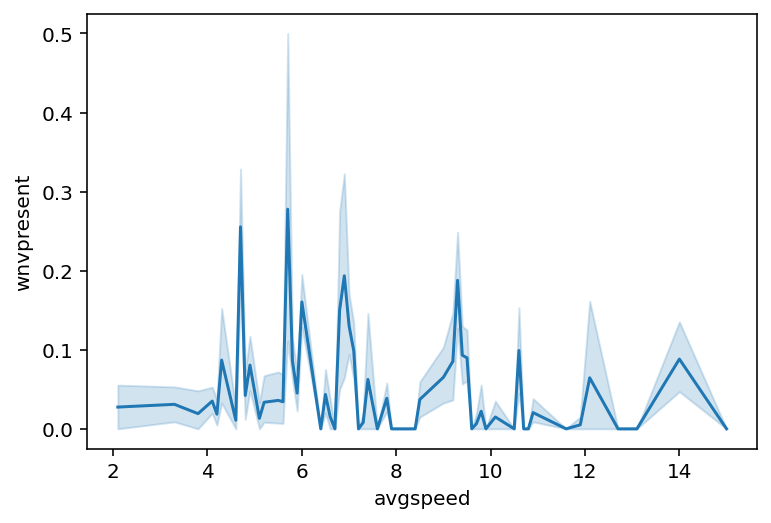

In [ ]:
sns.lineplot(data=combined_df, x="avgspeed", y="wnvpresent")

The West Nile Virus is most observed when the wind has an optimal average speed of between 4-7 miles per hour.

### Pesticide Area and Weather Variables

In [ ]:
#show a sample of the combined dataframe
combined_df.head(1)

,date,species,block,street,trap,latitude,longitude,addressaccuracy,nummosquitos,wnvpresent,tavg,dewpoint,wetbulb,codesum,preciptotal,stnpressure,sealevel,resultspeed,resultdir,avgspeed,year,month,day,geometry
0,2007-05-29,CULEX PIPIENS/RESTUANS,41.0,N OAK PARK AVE,T002,41.95469,-87.800991,9.0,1.0,0.0,74.0,58.0,65.0,BR HZ,0.0,29.39,30.11,5.8,18.0,6.5,2007,5,29,POINT (-87.80099 41.95469)


In [ ]:
# Add new column for area separation. The value 0 represents non_pesticide area, 
# the value 1 represents pesticide area

combined_df["pesticide"] = pd.cut(combined_df["longitude"], bins=[-88, -87.85, 0],labels=[0,1])

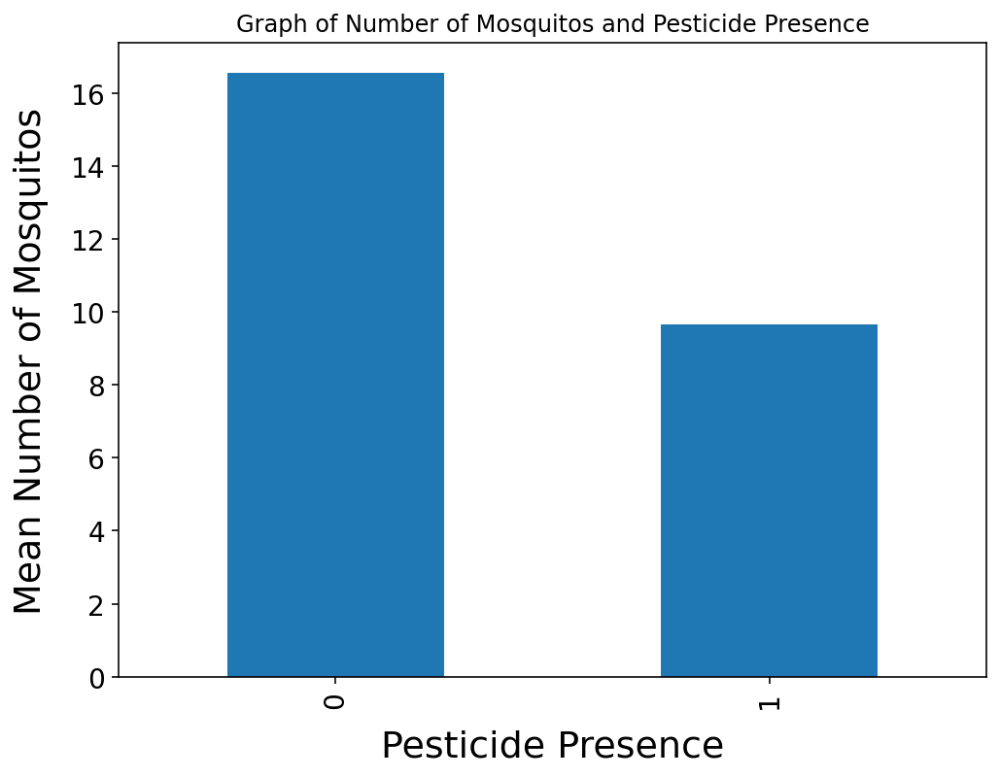

In [ ]:
# pesticide_area vs number of mosquitoes

fig, ax = plt.subplots(figsize=(8,6))

graph_3 = combined_df.groupby('pesticide')["nummosquitos"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Number of Mosquitos and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Number of Mosquitos', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

The mean number of mosquitos was much lower when pesticide was present, likely because the pesticide has a direct impact on mosquitos.

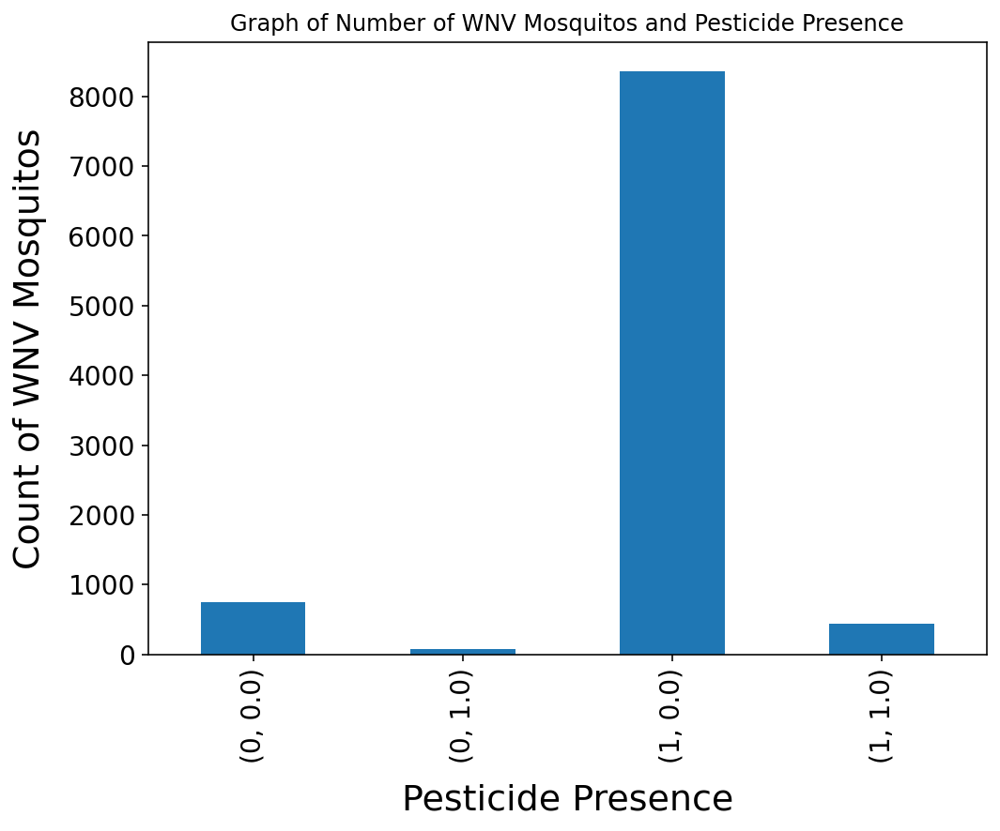

In [ ]:
# pesticide_area vs wnv presence

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["wnvpresent"].value_counts().plot(kind='bar', ax=ax)

plt.title("Graph of Number of WNV Mosquitos and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Count of WNV Mosquitos', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

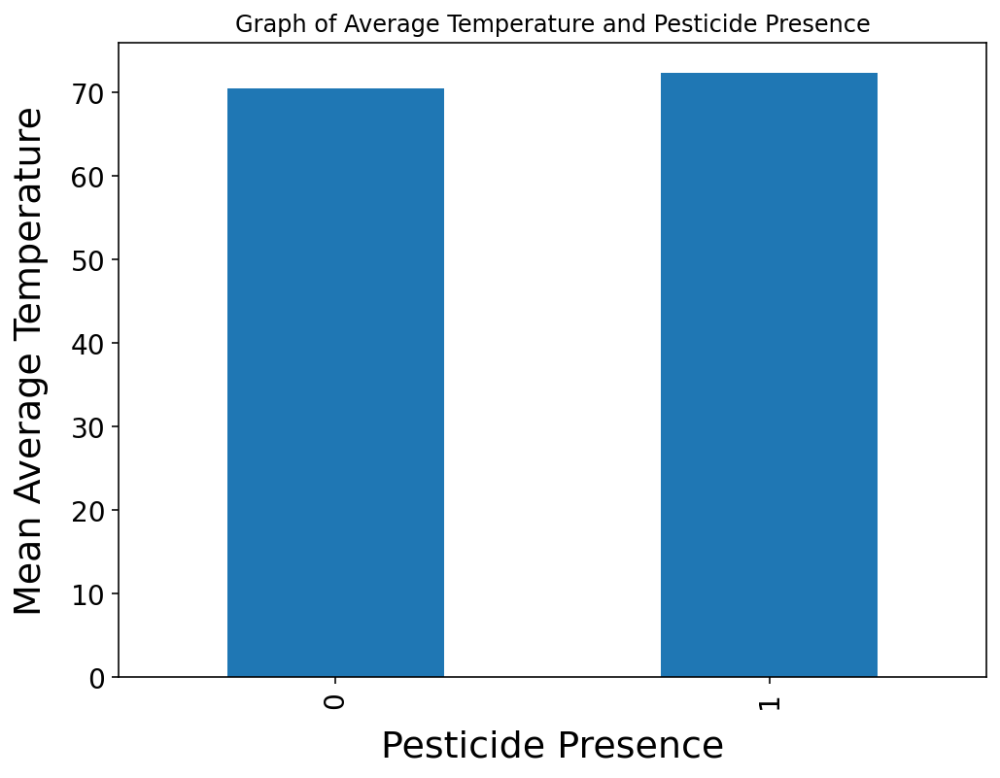

In [ ]:
# pesticide_area vs tavg

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["tavg"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Average Temperature and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Average Temperature', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

There seem to be no difference with regards to the combination of temperature and pesticide that can affect mosquitoes differently.

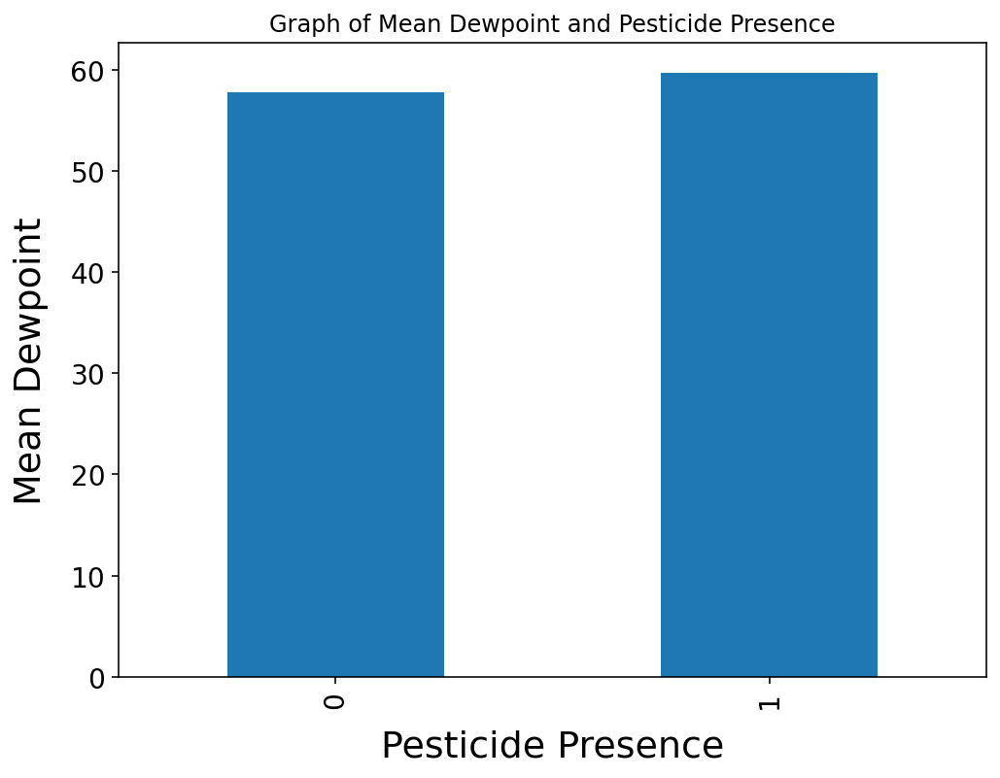

In [ ]:
# pesticide_area vs dewpoint

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["dewpoint"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Mean Dewpoint and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Dewpoint', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

The mean dew point did not have much of a relationship with pesticide presence

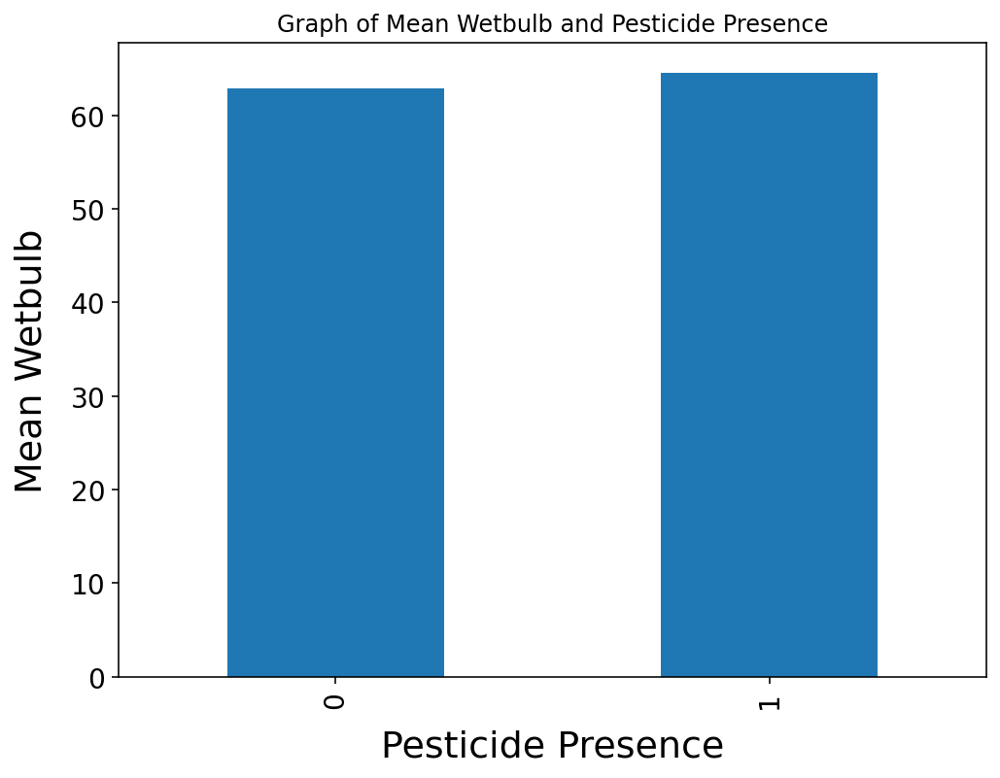

In [ ]:
# pesticide_area vs wetbulb

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["wetbulb"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Mean Wetbulb and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Wetbulb', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

The mean wetbulb did not have much of a relationship with pesticide presence

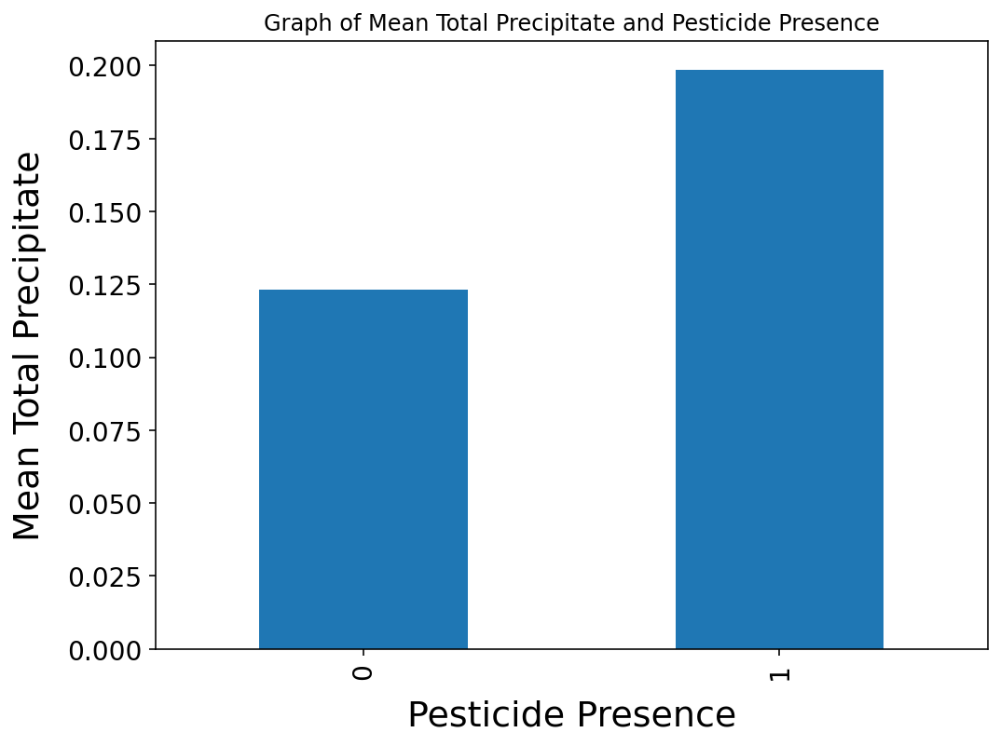

In [ ]:
# pesticide_area vs preciptotal

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["preciptotal"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Mean Total Precipitate and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Total Precipitate', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

Pesticide presence was seen with higher mean total precipitate, this could be due to precipitate being a factor for mosquito breeding, hence it corresponds to the spraying of pesticides

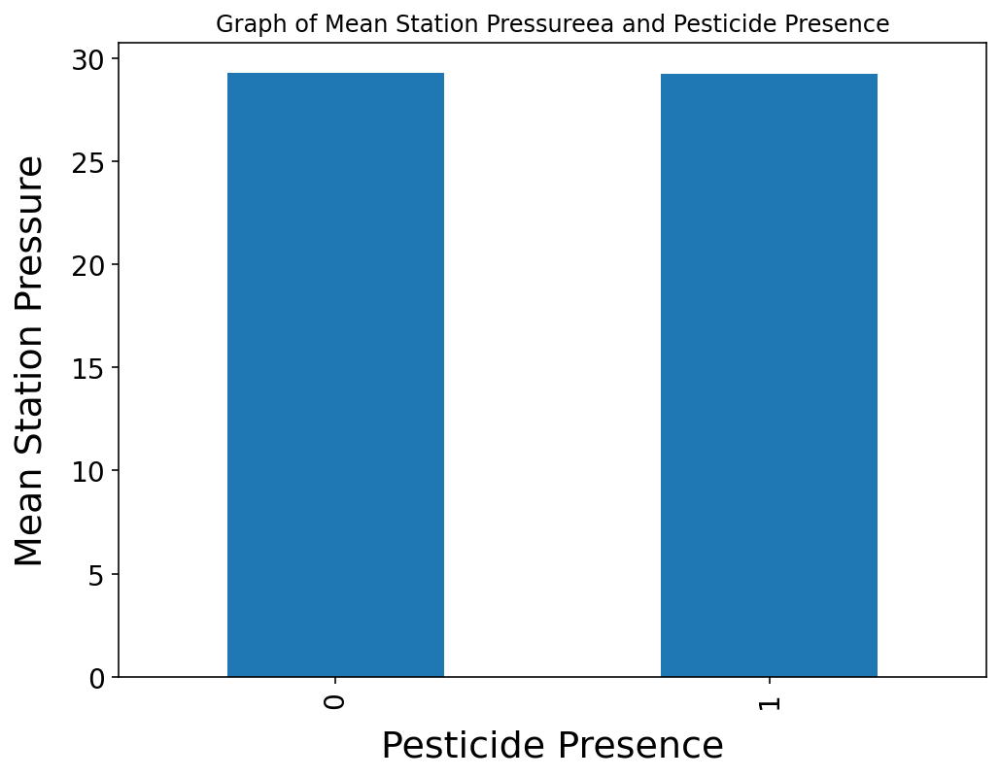

In [ ]:
# pesticide_area vs stnpressure

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["stnpressure"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Mean Station Pressureea and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Station Pressure', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

The mean pressure did not have much of a relationship with pesticide presence

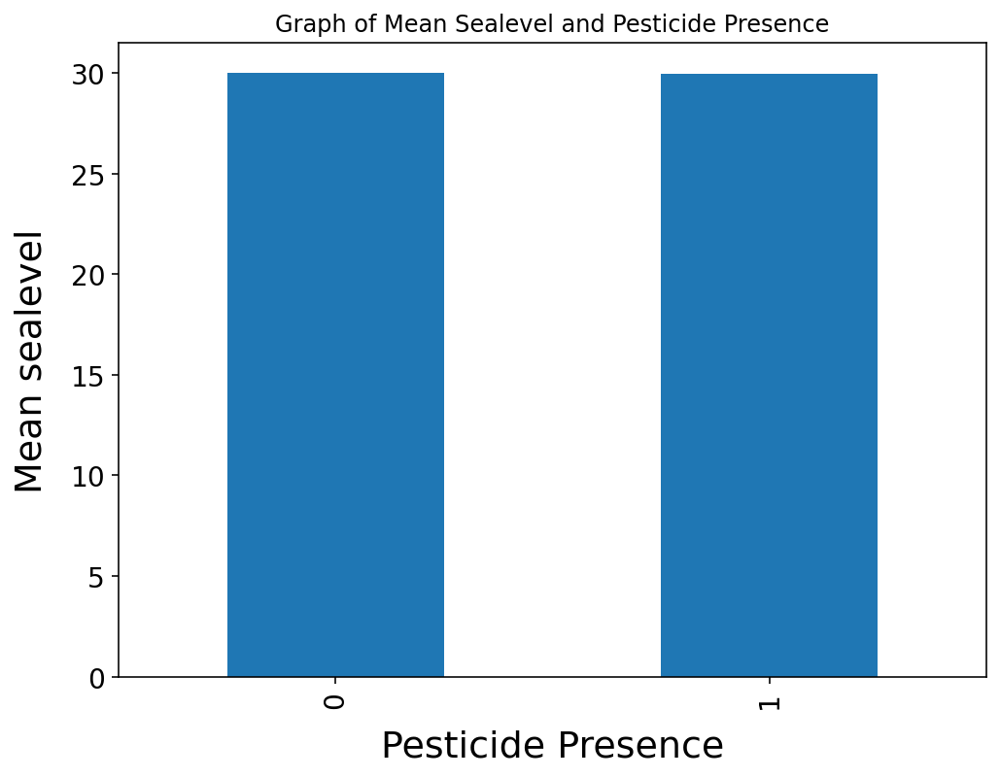

In [ ]:
# pesticide_area vs sealevel

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["sealevel"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Mean Sealevel and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean sealevel', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

The mean sea level did not have much of a relationship with pesticide presence

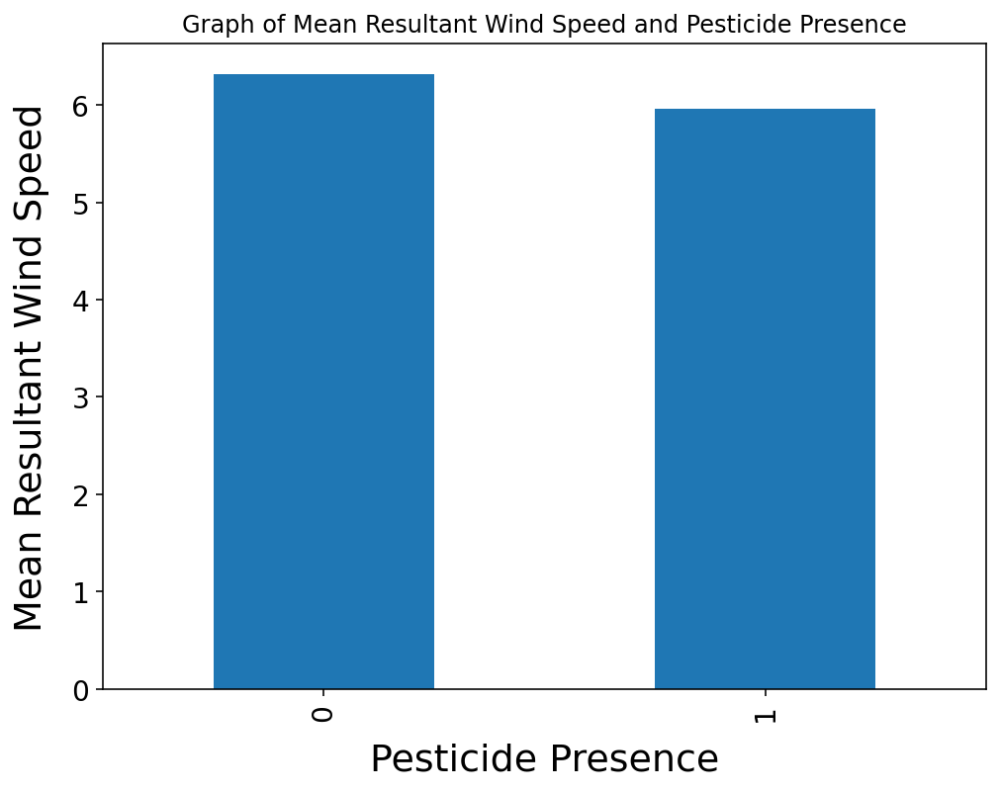

In [ ]:
# pesticide_area vs resultspeed

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["resultspeed"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Mean Resultant Wind Speed and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Resultant Wind Speed', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

The mean resultant wind speed did not have much of a relationship with pesticide presence

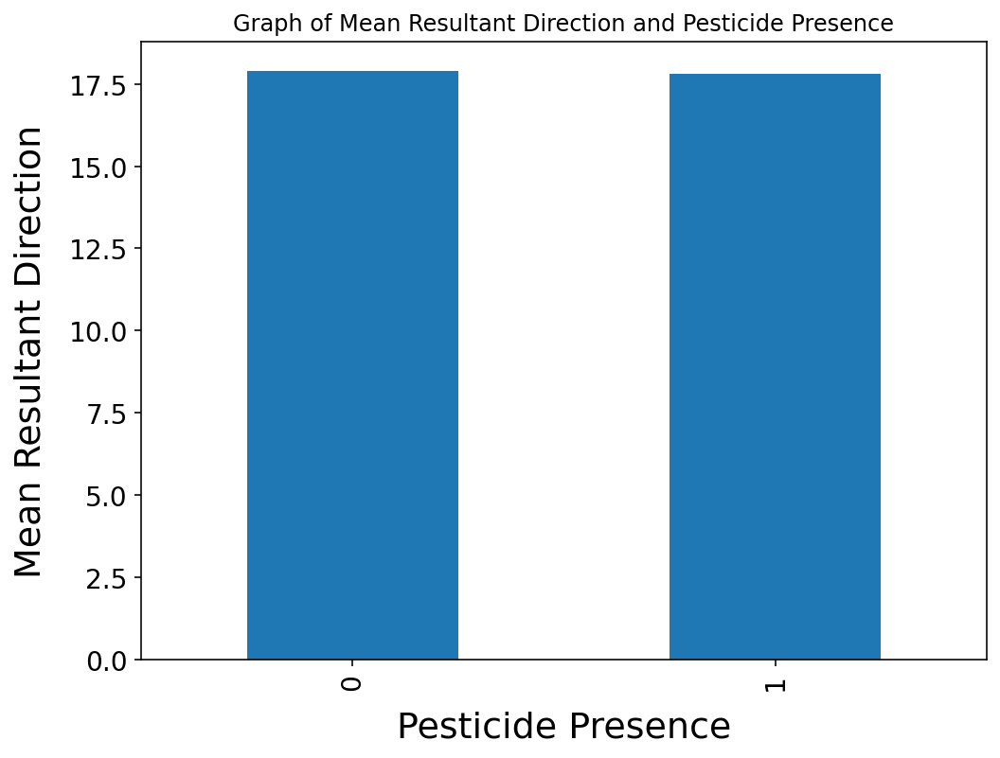

In [ ]:
# pesticide_area vs result dir

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["resultdir"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Mean Resultant Direction and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Resultant Direction', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

The mean wind direction did not have much of a relationship with pesticide presence

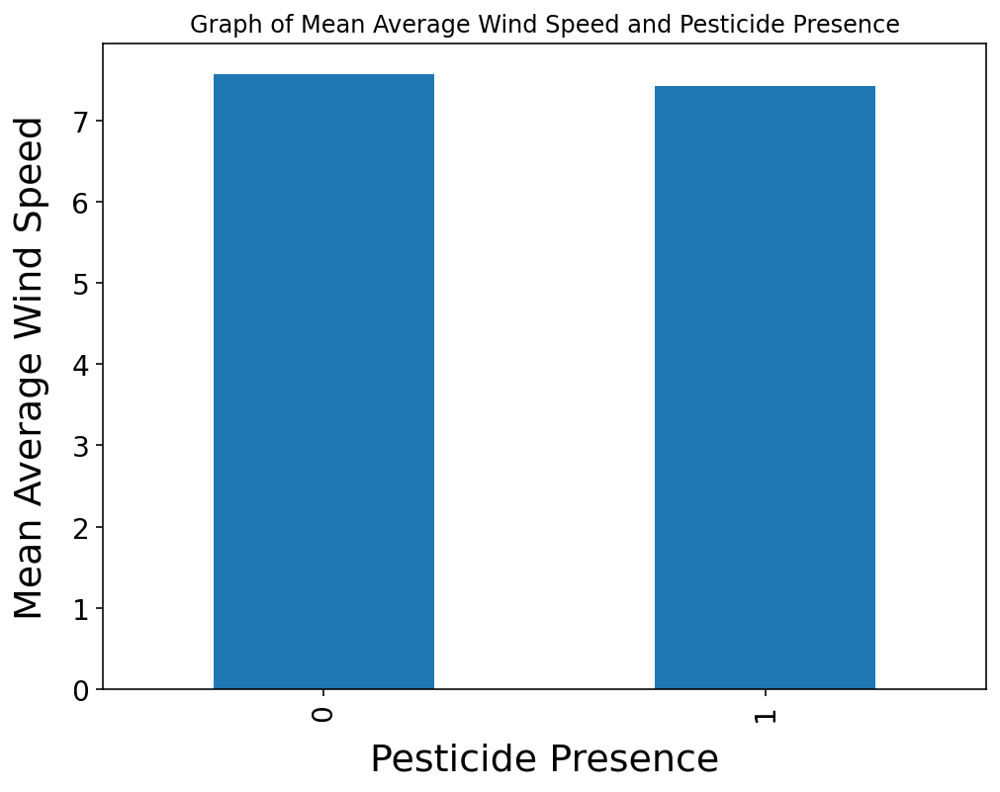

In [ ]:
# pesticide_area vs avgspeed

fig, ax = plt.subplots(figsize=(8,6))

graph_4 = combined_df.groupby('pesticide')["avgspeed"].mean().plot(kind='bar', ax=ax)

plt.title("Graph of Mean Average Wind Speed and Pesticide Presence")
plt.xlabel('Pesticide Presence', fontsize = 19, labelpad=11)
plt.xticks(fontsize=14)
plt.ylabel('Mean Average Wind Speed', fontsize=19, labelpad=11)
plt.yticks(fontsize=14);

The mean wind average speed did not have much of a relationship with pesticide presence

# Pre-Model Processing

In [ ]:
combined_df.columns

Index(['date', 'species', 'block', 'street', 'trap', 'latitude', 'longitude',
       'addressaccuracy', 'nummosquitos', 'wnvpresent', 'tavg', 'dewpoint',
       'wetbulb', 'codesum', 'preciptotal', 'stnpressure', 'sealevel',
       'resultspeed', 'resultdir', 'avgspeed', 'year', 'month', 'day',
       'geometry', 'pesticide'],
      dtype='object')

In [ ]:
#display the information for combined dataframe
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9601 entries, 0 to 9600
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   date             9601 non-null   object  
 1   species          9601 non-null   object  
 2   block            9601 non-null   float64 
 3   street           9601 non-null   object  
 4   trap             9601 non-null   object  
 5   latitude         9601 non-null   float64 
 6   longitude        9601 non-null   float64 
 7   addressaccuracy  9601 non-null   float64 
 8   nummosquitos     9601 non-null   float64 
 9   wnvpresent       9601 non-null   float64 
 10  tavg             9601 non-null   float64 
 11  dewpoint         9601 non-null   float64 
 12  wetbulb          9601 non-null   float64 
 13  codesum          9601 non-null   object  
 14  preciptotal      9601 non-null   float64 
 15  stnpressure      9601 non-null   float64 
 16  sealevel         9601 non-null   float64 


In [ ]:
#drop columns
combined_df.drop(columns=['codesum','date','geometry','nummosquitos'], axis=1, inplace=True)

#convert pesticide column to integers
combined_df['pesticide'] = combined_df['pesticide'].astype(int)

#create dummy variables and replace it
to_dummy = ['species', 'street', 'trap']
combined_df = pd.get_dummies(combined_df, columns = to_dummy, drop_first = True)

#output new set of column names to make sure they are correct
combined_df.columns

Index(['block', 'latitude', 'longitude', 'addressaccuracy', 'wnvpresent',
       'tavg', 'dewpoint', 'wetbulb', 'preciptotal', 'stnpressure',
       ...
       'trap_T230', 'trap_T231', 'trap_T232', 'trap_T233', 'trap_T235',
       'trap_T236', 'trap_T237', 'trap_T238', 'trap_T900', 'trap_T903'],
      dtype='object', length=283)

In [ ]:
#display information on the updated combined dataframe
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9601 entries, 0 to 9600
Columns: 283 entries, block to trap_T903
dtypes: float64(14), int64(4), uint8(265)
memory usage: 3.7 MB


In [ ]:
#export the dataset as CSV file
combined_df.to_csv('datasets/combined_df_for_model.csv', index=False)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=60b14a4f-b63c-4fa7-9c07-6649311f1d98' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>